# ELECTROENCEFALOGRAFÍA

## SET UP

Monto el drive:

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


[BASE DE DATOS A UTILIZAR](https://drive.google.com/drive/folders/1iSxLvw_ZgN7DrNBaDQJ0q7rMNbZgoCU5?usp=sharing)

> Recordar que puede ser util añadir acceso directo a "Mi Unidad" de esta carpeta



Instalo e importo las librerías que voy a utilizar:

In [ ]:
!pip install mne

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 102.5 MB/s eta 0:00:00


In [ ]:
!pip install yasa

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.8/33.8 MB 27.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.7/127.7 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 419.6/419.6 kB 25.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 423.6/423.6 kB 25.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 38.0 MB/s eta 0:00:00


* os (Operating System)
  * Para manejar rutas de archivos y carpetas.

* NumPy
  * Manejo de arrays y álgebra lineal.
  * Permite operaciones vectorizadas rápidas y eficientes.

* Pandas
  * Análisis y manipulación de datos.
  * Especialmente diseñada para trabajar con estructuras de datos tabulares.

* Matplotlib
  * Librería para visualizar los datos.
  * Permite hacer trazados personalizados y guardar imágenes.

* SciPy (Scientific Python)
  * Contiene módulos para estadística, optimización, álgebra lineal, integración, interpolación, transformada de Fourier, procesamiento de señales, y muchas otras funciones para ciencia e ingeniería.
  * SciPy Signal: Herramientas para el procesamiento de señales (filtros, convolución, detección de picos, etc.).
  * SciPy FFT: Análisis de frecuencia (espectros) por la transformada de Fourier.
  * SciPy I/O: Para leer y escribir archivos .mat (de MATLAB).

* MNE
  * Open-source Python package for exploring, visualizing, and analyzing human neurophysiological data: MEG, EEG, sEEG, ECoG, NIRS, and more.
  * La librería principal para análisis de EEG en Python.
  * Permite cargar archivos EEG en varios formatos (.edf, .bdf, .fif, .set, etc.).
  * Organiza los datos en objetos especializados (Raw, Epochs, Evoked) que mantienen toda la información bien estructurada.
  * Contiene funciones para: filtrar señales, detectar eventos, visualizar señales, análisis de frecuencias (PSD), análisis de componentes independientes (ICA), marcado de artefactos, anotaciones, etc.

* YASA (Yet Another Spindle Algorithm)
  * Librería especializada para el análisis automático del sueño en señales EEG.
  * Permite estimar etapas de sueño (sleep staging) basadas en EEG, sin necesidad de anotaciones manuales.
  * Contiene funciones para detectar husos, K-complexes, ondas lentas y transiciones del sueño.
  * Incluye herramientas para visualizar hipnogramas y espectrogramas de forma integrada y fácil de usar.
  * Se integra perfectamente con objetos de MNE (como Raw y anotaciones).


In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.signal as signal
from scipy.signal import windows
from scipy.fft import fft
import scipy.io
import mne
import yasa

## LECTURA DE ARCHIVO DE EEG


Veamos algunos formatos de archivos de datos de EEG, cómo los leemos y cómo accedemos a las señales.

### Path

Para unir dos path se puede usar la librería `os` que permite hacer este tipo de "uniones" de rutas lo cual hace que sea más cómodo de ahora en más llamar a la carpeta madre y a los archivos internos que usemos:

In [ ]:
os.path.sep

'/'

In [ ]:
ejemplo = os.path.join('Desktop', 'Docencia', '2025', 'PSIB', 'EEG', 'database')
ejemplo

'Desktop/Docencia/2025/PSIB/EEG/database'

El "path" que utilizaremos de ahora en más es:

In [ ]:
path = r'/content/drive/MyDrive/ClaseEEG-Señales/'

*(Siempre y cuando añadieran la base de datos a "Mi Unidad" como indique anteriormente)*

### .edf

**European Data Format (EDF):**

* Extensión: .edf

Es un formato de archivo estándar utilizado para el intercambio y almacenamiento de datos de series temporales médicas, especialmente en el campo de la electroencefalografía.

* Su estructura es sencilla, lo que facilita la lectura y escritura de archivos EDF.

* Permite almacenar datos de múltiples canales y diferentes tipos de datos (EEG, EOG, EMG, etc.).

* Guarda metadatos como nombre del sujeto y experimentador, fecha y hora de la grabación, frecuencia de muestreo, duración de la grabación, filtros, etc.

* Es compatible con una amplia gama de software y hardware para registro y análisis de datos de EEG.


Leo el archivo .edf usando MNE. Cargo el archivo y creo un objeto tipo Raw, que representa una grabación EEG multicanal.

In [ ]:
raw_edf_0 = mne.io.read_raw_edf(os.path.join(path, 'chb01_03.edf'), # uno el path de la carpeta con el nombre del archivo y creo el objeto Raw
                           preload=True) # carga los datos en memoria (para editarlos más fácilmente)

Extracting EDF parameters from /content/drive/MyDrive/ClaseEEG-Señales/chb01_03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipython-input-3702714459.py:1: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw_edf_0 = mne.io.read_raw_edf(os.path.join(path, 'chb01_03.edf'), # uno el path de la carpeta con el nombre del archivo y creo el objeto Raw


Reading 0 ... 921599  =      0.000 ...  3599.996 secs...


Imprimo el tipo de dato del objeto raw0 --> es una clase (<class 'mne.io.edf.edf.RawEDF'>)

Contiene:
- Las señales EEG (accesibles con .get_data())
- Metadatos de la grabación (en .info)
- Eventos (si hay)
- Funciones para filtrar, visualizar, exportar, cortar, etc.

In [ ]:
type(raw_edf_0)

mne.io.edf.edf.RawEDF

Con `.info` muestro la información general del archivo (fecha y hora del registro, cantidad de canales, frecuencia de muestreo, filtros aplicados, etc). Muy útil para conocer las propiedades del archivo antes de analizar.

In [ ]:
raw_edf_0.info # diccionario que contiene la información del objeto

<Info | 8 non-empty values
 bads: []
 ch_names: FP1-F7, F7-T7, T7-P7, P7-O1, FP1-F3, F3-C3, C3-P3, P3-O1, ...
 chs: 23 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 128.0 Hz
 meas_date: 2076-11-06 13:43:04 UTC
 nchan: 23
 projs: []
 sfreq: 256.0 Hz
 subject_info: <subject_info | his_id: Surrogate>
>

Muestro la lista con los nombres de los canales grabados en el archivo.

In [ ]:
raw_edf_0.ch_names # Lista de los nombres de los canales que tiene

['FP1-F7',
 'F7-T7',
 'T7-P7',
 'P7-O1',
 'FP1-F3',
 'F3-C3',
 'C3-P3',
 'P3-O1',
 'FP2-F4',
 'F4-C4',
 'C4-P4',
 'P4-O2',
 'FP2-F8',
 'F8-T8',
 'T8-P8-0',
 'P8-O2',
 'FZ-CZ',
 'CZ-PZ',
 'P7-T7',
 'T7-FT9',
 'FT9-FT10',
 'FT10-T8',
 'T8-P8-1']

Notemos que ahora podemos entender estos nombres de los canales. Son canales de un montaje bipolar, es decir, que las señales son las diferencias de potencial entre los dos electrodos. Por ejemplo: 'FP1-F7' significa "electrodo FP1 (frente izquiera) menos electrodo F7 (frontal izquierda)" → la señal es la diferencia entre esos dos puntos.

![Sistema 10-20](https://www.researchgate.net/profile/Carlos_Novo-Olivas/publication/282294960/figure/fig2/AS:391565940936705@1470368003555/Figura-3-Sistema-Internacional-10-20-para-la-colocacion-de-los-electrodos_W640.jpg)

Podemos ver los tipos de los canales usando `.get_channel_types()` --> si tenemos una polisomnografía podemos tener tipo EEG, EOG, EMG, ECG, etc.

In [ ]:
raw_edf_0.get_channel_types()

['eeg',
 'eeg',
 'eeg',
 'eeg',
 'eeg',
 'eeg',
 'eeg',
 'eeg',
 'eeg',
 'eeg',
 'eeg',
 'eeg',
 'eeg',
 'eeg',
 'eeg',
 'eeg',
 'eeg',
 'eeg',
 'eeg',
 'eeg',
 'eeg',
 'eeg',
 'eeg']

Podemos ver los nombres de los canales con su tipo de forma simultánea.

In [ ]:
for name, tipo in zip(raw_edf_0.ch_names, raw_edf_0.get_channel_types()):
    print(name, tipo)

FP1-F7 eeg
F7-T7 eeg
T7-P7 eeg
P7-O1 eeg
FP1-F3 eeg
F3-C3 eeg
C3-P3 eeg
P3-O1 eeg
FP2-F4 eeg
F4-C4 eeg
C4-P4 eeg
P4-O2 eeg
FP2-F8 eeg
F8-T8 eeg
T8-P8-0 eeg
P8-O2 eeg
FZ-CZ eeg
CZ-PZ eeg
P7-T7 eeg
T7-FT9 eeg
FT9-FT10 eeg
FT10-T8 eeg
T8-P8-1 eeg


Si no estuvieran etiquetados o lo estuvieran incorrectamente se puede hacer usando `.set_channel_types()`. Esto me permite seleccionar y procesar de diferente manera los distintos tipos de señales.

In [ ]:
raw_edf_1 = raw_edf_0.copy() # copio el objeto asi no modifico el original
raw_edf_1.set_channel_types({'FP1-F7': 'eeg', 'F7-T7': 'emg', 'T7-P7': 'eog'})
raw_edf_1.get_channel_types()

['eeg',
 'emg',
 'eog',
 'eeg',
 'eeg',
 'eeg',
 'eeg',
 'eeg',
 'eeg',
 'eeg',
 'eeg',
 'eeg',
 'eeg',
 'eeg',
 'eeg',
 'eeg',
 'eeg',
 'eeg',
 'eeg',
 'eeg',
 'eeg',
 'eeg',
 'eeg']

Obtengo los datos de los canales y el vector de tiempos. Puedo hacerlo usando las funciones `.get_data()` y `.times`.

In [ ]:
times_edf = raw_edf_0.times # obtengo el vector de tiempos en segundos (los tiempos de cada muestra)
times_edf

array([0.00000000e+00, 3.90625000e-03, 7.81250000e-03, ...,
       3.59998828e+03, 3.59999219e+03, 3.59999609e+03])

In [ ]:
data_edf = raw_edf_0.get_data() # Obtener un numpy array con todos los canales
data_edf #  Muestro el array NumPy de los datos de los canales

array([[-1.77777778e-05,  1.95360195e-07,  1.95360195e-07, ...,
        -1.77777778e-05, -8.79120879e-06, -4.88400488e-06],
       [ 3.92673993e-05,  1.95360195e-07,  1.95360195e-07, ...,
        -2.32478632e-05, -2.24664225e-05, -2.05128205e-05],
       [-3.71184371e-06,  1.95360195e-07,  1.95360195e-07, ...,
         5.91941392e-05,  6.03663004e-05,  5.91941392e-05],
       ...,
       [-9.18192918e-06,  1.95360195e-07,  1.95360195e-07, ...,
         4.86446886e-05,  2.79365079e-05,  1.26984127e-05],
       [-3.96581197e-05,  1.95360195e-07,  1.95360195e-07, ...,
         4.35653236e-05,  3.84859585e-05,  3.61416361e-05],
       [-5.99755800e-05,  1.95360195e-07,  1.95360195e-07, ...,
         1.93406593e-05,  2.63736264e-05,  3.22344322e-05]])

Vemos que los datos están en voltios pero tienen valores del orden de los microvoltios. MNE carga los datos en voltios, pero para visualizar (por ejemplo, con .plot()), automáticamente los convierte a microvoltios (µV) para que el gráfico tenga una escala más intuitiva. Si vamos a usar otras funciones por fuera de MNE debemos considerar las escalas cuidadosamente, y en todo caso multiplicar los valores por *1e6 para pasarlos a microvoltios.

Obtengo la dimensión del Numpy array de los datos (las dimensiones de la matriz). Vemos que tiene n canales de m muestras.

In [ ]:
data_edf.shape # Veo la dimensión (n_canales, m_muestras)

(23, 921600)

También podría acceder a la matriz de datos y al vector de tiempos así:

In [ ]:
data_edf, times_edf = raw_edf_0[:]

In [ ]:
times_edf

array([0.00000000e+00, 3.90625000e-03, 7.81250000e-03, ...,
       3.59998828e+03, 3.59999219e+03, 3.59999609e+03])

In [ ]:
data_edf

array([[-1.77777778e-05,  1.95360195e-07,  1.95360195e-07, ...,
        -1.77777778e-05, -8.79120879e-06, -4.88400488e-06],
       [ 3.92673993e-05,  1.95360195e-07,  1.95360195e-07, ...,
        -2.32478632e-05, -2.24664225e-05, -2.05128205e-05],
       [-3.71184371e-06,  1.95360195e-07,  1.95360195e-07, ...,
         5.91941392e-05,  6.03663004e-05,  5.91941392e-05],
       ...,
       [-9.18192918e-06,  1.95360195e-07,  1.95360195e-07, ...,
         4.86446886e-05,  2.79365079e-05,  1.26984127e-05],
       [-3.96581197e-05,  1.95360195e-07,  1.95360195e-07, ...,
         4.35653236e-05,  3.84859585e-05,  3.61416361e-05],
       [-5.99755800e-05,  1.95360195e-07,  1.95360195e-07, ...,
         1.93406593e-05,  2.63736264e-05,  3.22344322e-05]])

Obtengo la frecuencia de muestreo (en Hz - cuántas veces por segundo se tomó una muestra). La guardo en una variable y en lugar de "hardcodear" el valor a lo largo del código, llamo siempre a la variable.

In [ ]:
raw_edf_0.info['sfreq'] # Veo la frecuencia de muestreo

256.0

In [ ]:
fs_edf = raw_edf_0.info['sfreq'] # Obtener la frecuencia de muestreo
fs_edf = int(fs_edf) # La convierto a int (entero), para facilitar cálculos posteriores.

Calculo y muestro la duración total del registro en segundos y minutos. Para ello, divido el número total de muestras por la frecuencia de muestreo.
También muestro la cantidad de canales registrados.

In [ ]:
print(f'En el registro hay {data_edf.shape[1]/fs_edf} segundos ({data_edf.shape[1]/fs_edf/60} mins) de registro')
print(f'En el registro hay {len(raw_edf_0.ch_names)} canales registrados')

En el registro hay 3600.0 segundos (60.0 mins) de registro
En el registro hay 23 canales registrados


Si quisiera quedarme con un canal, de nuevo consulto la lista de los nombres de los canales para elegir uno según su índice en la lista.

In [ ]:
raw_edf_0.ch_names # Veo los nombres de los canales

['FP1-F7',
 'F7-T7',
 'T7-P7',
 'P7-O1',
 'FP1-F3',
 'F3-C3',
 'C3-P3',
 'P3-O1',
 'FP2-F4',
 'F4-C4',
 'C4-P4',
 'P4-O2',
 'FP2-F8',
 'F8-T8',
 'T8-P8-0',
 'P8-O2',
 'FZ-CZ',
 'CZ-PZ',
 'P7-T7',
 'T7-FT9',
 'FT9-FT10',
 'FT10-T8',
 'T8-P8-1']

Si quiero por ejemplo el canal 'FP1-F7', lo selecciono según su índice (índice 0) del array de datos.

In [ ]:
ch1 = data_edf[0] # Selecciono el primer canal --> Es el canal FP1-F7
ch1_name = raw_edf_0.ch_names[0] # Selecciono el nombre del primer canal
print(ch1)
print(ch1_name)

[-1.77777778e-05  1.95360195e-07  1.95360195e-07 ... -1.77777778e-05
 -8.79120879e-06 -4.88400488e-06]
FP1-F7


O puedo utilizar las funciones `raw.pick()` para seleccionar algunos canales específicos o un tipo de canal (ej todos los EEG, o los EOG, etc).

In [ ]:
for name, tipo in zip(raw_edf_1.ch_names, raw_edf_1.get_channel_types()):
    print(name, tipo)

FP1-F7 eeg
F7-T7 emg
T7-P7 eog
P7-O1 eeg
FP1-F3 eeg
F3-C3 eeg
C3-P3 eeg
P3-O1 eeg
FP2-F4 eeg
F4-C4 eeg
C4-P4 eeg
P4-O2 eeg
FP2-F8 eeg
F8-T8 eeg
T8-P8-0 eeg
P8-O2 eeg
FZ-CZ eeg
CZ-PZ eeg
P7-T7 eeg
T7-FT9 eeg
FT9-FT10 eeg
FT10-T8 eeg
T8-P8-1 eeg


In [ ]:
raw_edf_1.pick(['eog', 'emg'])
raw_edf_1.ch_names

['F7-T7', 'T7-P7']

In [ ]:
raw_edf_1.get_channel_types()

['emg', 'eog']

In [ ]:
raw_edf_1.pick('F7-T7')
raw_edf_1.ch_names

['F7-T7']

Con `.annotations` puedo ver si hay anotaciones. Las anotaciones son globales, para todos los canales. Se pueden marcar etapas de sueño, eventos, artefactos, estímulos... Y tienen un onset (comienzo), duration (duración) y description (etiqueta).

In [ ]:
raw_edf_0.annotations

<Annotations | 0 segments>

Puedo agregar anotationes mediante el `append`.

In [ ]:
raw_edf_0.annotations.append(onset=120.0, duration=5.0, description='artefacto')
raw_edf_0.annotations

<Annotations | 1 segment: artefacto (1)>

También puedo ver si hay canales marcados como "bad channels", es decir, canales que tienen mucho ruido o se perdieron para eliminarlos de futuros análisis.

In [ ]:
raw_edf_0.info['bads']

[]

Puedo marcar canales como 'bads' así:

In [ ]:
raw_edf_2 = raw_edf_0.copy()
raw_edf_2.info['bads'] = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3']
raw_edf_2.info['bads']

['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3']

También puedo eliminar canales usando `.drop_channels`

In [ ]:
raw_edf_2.ch_names

['FP1-F7',
 'F7-T7',
 'T7-P7',
 'P7-O1',
 'FP1-F3',
 'F3-C3',
 'C3-P3',
 'P3-O1',
 'FP2-F4',
 'F4-C4',
 'C4-P4',
 'P4-O2',
 'FP2-F8',
 'F8-T8',
 'T8-P8-0',
 'P8-O2',
 'FZ-CZ',
 'CZ-PZ',
 'P7-T7',
 'T7-FT9',
 'FT9-FT10',
 'FT10-T8',
 'T8-P8-1']

In [ ]:
raw_edf_2.drop_channels(['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3'])
raw_edf_2.ch_names

['F3-C3',
 'C3-P3',
 'P3-O1',
 'FP2-F4',
 'F4-C4',
 'C4-P4',
 'P4-O2',
 'FP2-F8',
 'F8-T8',
 'T8-P8-0',
 'P8-O2',
 'FZ-CZ',
 'CZ-PZ',
 'P7-T7',
 'T7-FT9',
 'FT9-FT10',
 'FT10-T8',
 'T8-P8-1']

Por ejemplo, al preprocesar el EEG podríamos quedarnos con un objeto "clean" al seleccionar solo los canales de EEG que no estén marcados como bads.

`raw_clean = raw.pick('eeg').drop_channels(raw.info['bads'])`


### .mat

**MATLAB Data File:**

* Extensión: .mat

Es un formato de archivo utilizado por MATLAB para guardar variables y estructuras de datos, incluyendo matrices, vectores, estructuras y celdas. Es muy común en investigación científica y médica, ya que MATLAB ha sido históricamente una herramienta dominante en el procesamiento de señales biomédicas, como el EEG.

* Puede almacenar señales multicanal (en forma de matrices), metadatos asociados (nombres de canales, frecuencia de muestreo, duración, etc.), y estructuras complejas como diccionarios anidados o listas de eventos.

* No tiene un formato estándar específico para EEG, pero muchos laboratorios guardan sus señales EEG en .mat con convenciones propias (por ejemplo, estructuras con campos: data, labels, fs).

* Se puede leer fácilmente desde Python usando scipy.io.loadmat, lo cual permite reutilizar datos de estudios previos hechos en MATLAB.

* Es útil para trabajar con señales personalizadas o exportadas desde software de análisis como EEGLAB (MATLAB).

Cargamos el archivo .mat como un diccionario de Python. Cada variable guardada en MATLAB se convierte en una clave del diccionario.

In [ ]:
arch_mat = scipy.io.loadmat(os.path.join(path,'eeg_epilepsia.mat')) # Leo y cargo los datos del archivo .mat

Muestro la variable. Vemos que tiene un header con un texto que contiene información del registro como la fecha y hora, y los valores de las señales (data) y su información asociada.

In [ ]:
arch_mat

{'__header__': b'MATLAB 5.0 MAT-file, Platform: PCWIN64, Created on: Sun May  3 15:18:03 2020',
 '__version__': '1.0',
 '__globals__': [],
 'data': array([[(array([[-18.94993895, -19.73137973, -18.16849817, ...,  -1.75824176,
                   6.44688645,   8.4004884 ],
                [-22.46642247, -16.996337  , -12.30769231, ...,  31.84371184,
                  34.18803419,  43.56532357],
                [-22.07570208, -20.9035409 , -18.55921856, ...,   9.57264957,
                   6.83760684,   8.00976801],
                ...,
                [ 31.84371184,  27.54578755,  23.63858364, ...,  -3.32112332,
                 -18.16849817, -25.2014652 ],
                [-13.08913309, -11.91697192,  -9.18192918, ..., -21.29426129,
                 -34.57875458, -32.23443223],
                [-50.5982906 , -45.51892552, -38.87667888, ...,  55.28693529,
                  42.002442  ,  38.0952381 ]]), array([[256]], dtype=uint16), array([[2876.        , 2876.00390625, 2876.0078125 , ..

Muestro el tipo de dato que es la variable arch. Es de tipo dict, como decíamos.

In [ ]:
type(arch_mat) # Obtengo el tipo de dato

dict

Muestro las claves del diccionario del archivo .mat.

In [ ]:
print(sorted(arch_mat.keys())) # Imprimo la lista ordenada de las llaves del diccionario

['__globals__', '__header__', '__version__', 'data']


Veo qué hay dentro de la key `data` del archivo cargado.

In [ ]:
data_mat = arch_mat['data'] # Obtengo el valor de la llave 'data' del diccionario arch
data_mat

array([[(array([[-18.94993895, -19.73137973, -18.16849817, ...,  -1.75824176,
                  6.44688645,   8.4004884 ],
               [-22.46642247, -16.996337  , -12.30769231, ...,  31.84371184,
                 34.18803419,  43.56532357],
               [-22.07570208, -20.9035409 , -18.55921856, ...,   9.57264957,
                  6.83760684,   8.00976801],
               ...,
               [ 31.84371184,  27.54578755,  23.63858364, ...,  -3.32112332,
                -18.16849817, -25.2014652 ],
               [-13.08913309, -11.91697192,  -9.18192918, ..., -21.29426129,
                -34.57875458, -32.23443223],
               [-50.5982906 , -45.51892552, -38.87667888, ...,  55.28693529,
                 42.002442  ,  38.0952381 ]]), array([[256]], dtype=uint16), array([[2876.        , 2876.00390625, 2876.0078125 , ..., 3155.9921875 ,
                3155.99609375, 3156.        ]]))                                                                                              

Veo que tipo de objeto es la variable data.

In [ ]:
type(data_mat) # Obtengo el tipo de dato

numpy.ndarray

Obtengo las dimensiones de data.

In [ ]:
data_mat.shape # Obtengo la dimension del numpy array

(1, 1)

Veo qué tipo de datos contiene el numpy.ndarray data, o sea, el tipo de cada elemento dentro del array.

In [ ]:
data_mat.dtype

dtype([('x', 'O'), ('fs', 'O'), ('tiempo', 'O')])

Por lo tanto, data es un numpy.ndarray, de dimensión (1,1), con datos estructurados de la forma dtype=[('x', 'O'), ('fs', 'O'), ('tiempo', 'O')]:

data = array([[(array(...), array(...), array(...))]],
       dtype=[('x', 'O'), ('fs', 'O'), ('tiempo', 'O')])

Un numpy.ndarray es un arreglo de múltiples dimensiones con datos del mismo tipo. Que tenga una dimensión (1,1) quiere decir que es un array bidimensional de 1 fila y 1 columna, como una matriz 1x1, que contiene un único elememto. Dicho elemento es un array estructurado (ndarrays cuyo tipo de datos es una composición de tipos de datos más simples organizados como una secuencia de campos con nombre --> como una tupla nombrada), con tres campos:
- 'x': La matriz de EEG, donde las filas representan canales y las columnas tiempo.
- 'fs': La frecuencia de muestreo, como un array de un solo valor.
- 'tiempo': El vector de tiempos, alineado con las columnas de x.

Cada entrada tiene como tipo 'O' (object), por lo que puede contener arrays de distinta dimensión y formato.


Dado que la dimensión es (1,1) accedo al único elemento con los índices [0,0].

In [ ]:
data_mat[0,0] # Obtengo el único elemento de data

np.void((array([[-18.94993895, -19.73137973, -18.16849817, ...,  -1.75824176,
          6.44688645,   8.4004884 ],
       [-22.46642247, -16.996337  , -12.30769231, ...,  31.84371184,
         34.18803419,  43.56532357],
       [-22.07570208, -20.9035409 , -18.55921856, ...,   9.57264957,
          6.83760684,   8.00976801],
       ...,
       [ 31.84371184,  27.54578755,  23.63858364, ...,  -3.32112332,
        -18.16849817, -25.2014652 ],
       [-13.08913309, -11.91697192,  -9.18192918, ..., -21.29426129,
        -34.57875458, -32.23443223],
       [-50.5982906 , -45.51892552, -38.87667888, ...,  55.28693529,
         42.002442  ,  38.0952381 ]]), array([[256]], dtype=uint16), array([[2876.        , 2876.00390625, 2876.0078125 , ..., 3155.9921875 ,
        3155.99609375, 3156.        ]])), dtype=[('x', 'O'), ('fs', 'O'), ('tiempo', 'O')])

Veo que tipo de dato es.

In [ ]:
type(data_mat[0,0]) # vemos que tipo de dato es data[0,0]

numpy.void



> ¿Qué es un numpy void?
[Link 2](https://numpy.org/doc/stable/reference/arrays.dtypes.html)

Al indexar un array estructurado (numpy.ndarray) se obtiene un objeto numpy.void. Este objeto actúa como una vista del array original, lo que significa que si modificás el objeto numpy.void, también se modificará el array original. Permite acceder y modificar los campos por nombre o por índice, de forma similar a cómo interactuarías con una tupla o un diccionario.


In [ ]:
registro_mat = data_mat[0,0] # llamemos registro al elemento de data

Podemos acceder a los campos del registro con sus nombres: 'x', 'fs' y 'tiempo'

In [ ]:
x_mat = registro_mat['x'] # Accedo al campo 'x' y lo guardo en una variable x
x_mat

array([[-18.94993895, -19.73137973, -18.16849817, ...,  -1.75824176,
          6.44688645,   8.4004884 ],
       [-22.46642247, -16.996337  , -12.30769231, ...,  31.84371184,
         34.18803419,  43.56532357],
       [-22.07570208, -20.9035409 , -18.55921856, ...,   9.57264957,
          6.83760684,   8.00976801],
       ...,
       [ 31.84371184,  27.54578755,  23.63858364, ...,  -3.32112332,
        -18.16849817, -25.2014652 ],
       [-13.08913309, -11.91697192,  -9.18192918, ..., -21.29426129,
        -34.57875458, -32.23443223],
       [-50.5982906 , -45.51892552, -38.87667888, ...,  55.28693529,
         42.002442  ,  38.0952381 ]])

Vemos que los valores en este caso ya están en microvoltios.

Veo la dimensión de x: cuántos canales y muestras tiene.

In [ ]:
x_mat.shape # Veo la dimensión de x

(23, 71681)

<font color='yellow'>¿A qué hace referencia este tamaño?</font>

Tiene 23 canales de 71681 muestras.

In [ ]:
cant_canales_mat = x_mat.shape[0]
cant_canales_mat

23

In [ ]:
cant_muestras_mat = x_mat.shape[1]
cant_muestras_mat

71681

Obtengo la frecuencia de muestreo 'fs'.

In [ ]:
registro_mat['fs'] # obtengo el objeto fs fs

array([[256]], dtype=uint16)

In [ ]:
registro_mat['fs'].shape

(1, 1)

En lugar de ser un entero, fs tiene la forma (1,1). Lo mismo sucederá con el tiempo, donde en lugar de ser un vector, tendrá la forma (1, N). Esto pasa porque se guardan como matrices desde MATLAB.

In [ ]:
registro_mat['tiempo'] # obtengo el objeto tiempo

array([[2876.        , 2876.00390625, 2876.0078125 , ..., 3155.9921875 ,
        3155.99609375, 3156.        ]])

In [ ]:
registro_mat['tiempo'].shape

(1, 71681)

Vamos a sacarle las dimensiones de más para tener el tipo de dato que queremos.

In [ ]:
fs_mat = registro_mat['fs'][0,0] # Accedo al entero
fs_mat

np.uint16(256)

In [ ]:
t_mat = registro_mat['tiempo'][0] # Accedo al array 1D --> podría usar tambien .flatten()
t_mat

array([2876.        , 2876.00390625, 2876.0078125 , ..., 3155.9921875 ,
       3155.99609375, 3156.        ])

In [ ]:
len(t_mat)

71681

In [ ]:
x_mat.shape[1] == len(t_mat)

True

Vemos que el vector de tiempos tiene la misma cantidad de muestras que los canales.

In [ ]:
type(t_mat)

numpy.ndarray

Podemos ver el intervalo de muestreo como 1/fs.

In [ ]:
1/fs_mat

np.float64(0.00390625)

Que debe coincidir con la diferencia entre dos tiempos consecutivos.

In [ ]:
t_mat[100]-t_mat[99] # diferencia de tiempo entre dos muestras temporales consecutivas

np.float64(0.00390625)

<font color='yellow'>¿Cuántos segundos de la señal hay registrados?</font>


In [ ]:
print('Se registraron', cant_muestras_mat/fs_mat , 'segundos') # divido la cantidad de muestras por la fs para obtenes la cantidad de segundos de registro
print('Se registraron', cant_muestras_mat/fs_mat/60 , 'minutos') # convierto los segundos a minutos

Se registraron 280.00390625 segundos
Se registraron 4.666731770833334 minutos


Entonces tengo las variables :

*   `x`: matriz donde en cada fila están los canales cargados
*   `fs`: frecuencia de muestreo
*   `t`: vector tiempo
*   `cant_canales`: cantidad de canales dentro de x
*   `cant_muestras`: cantidad de muestras de cada canal de x y del vector de tiempo


Podemos definir un array con los índices de los canales que va a ser de utilidad para indezar los canales de la matriz más adelante. Como vimos, en este caso no tenemos los nombres de los canales dentro del archivo, seguramente estén almacenados en otro archivo o descriptos en una documentación de los datos.

In [ ]:
canales_mat = np.arange(0,cant_canales_mat)+1 # creamos un arreglo con numeros enteros consecutivos de la cantidad de canales que tengo [1, 2, ..., 23]
canales_mat

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23])

### .vhdr

BrainVision es un formato de archivo EEG muy utilizado, especialmente en estudios grabados con sistemas Brain Products. Está compuesto por tres archivos separados que trabajan juntos:

- .vhdr: archivo cabecera (header), contiene la información general de la grabación.

- .vmrk: archivo de marcadores, donde están los eventos (inicio de ensayo, estímulos, etc.).

- .eeg: archivo binario que contiene los datos crudos del EEG.

⚠️ Todos estos archivos deben tener el mismo nombre base y estar en la misma carpeta.

La librería mne facilita la lectura de estos archivos. Solo necesitas cargar el .vhdr, y mne se encarga de enlazar los otros automáticamente.

In [ ]:
raw_vhdr_0 = mne.io.read_raw_brainvision(os.path.join(path, 'S61.vhdr'), preload=True)

Extracting parameters from /content/drive/MyDrive/ClaseEEG-Señales/S61.vhdr...
Setting channel info structure...
Reading 0 ... 6163195  =      0.000 ... 30815.975 secs...


/tmp/ipython-input-1161555156.py:1: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw_vhdr_0 = mne.io.read_raw_brainvision(os.path.join(path, 'S61.vhdr'), preload=True)
/tmp/ipython-input-1161555156.py:1: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.03 Hz) will be stored.
  raw_vhdr_0 = mne.io.read_raw_brainvision(os.path.join(path, 'S61.vhdr'), preload=True)
/tmp/ipython-input-1161555156.py:1: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (90.00 Hz) will be stored.
  raw_vhdr_0 = mne.io.read_raw_brainvision(os.path.join(path, 'S61.vhdr'), preload=True)


A partir de tener el objeto raw, es lo mismo que cuando teníamos el edf.

In [ ]:
raw_vhdr_0.info

<Info | 7 non-empty values
 bads: []
 ch_names: C3_1, C4_1, F3_1, F4_1, P3_1, P4_1, EOG1_1, EOG2_1, EMG1_1, EMG2_1
 chs: 10 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 90.0 Hz
 meas_date: 2017-10-03 23:45:05 UTC
 nchan: 10
 projs: []
 sfreq: 200.0 Hz
>

En este caso, estos archivos corresponden a una noche de sueño. Es muy común tener un archivo de texto .txt (u otro formato) con el scoring del sueño. Comúnmente, el scoring se almacena con las etiquetas correspondientes a cada época de 30 segundos. Según la nomenclatura utilizada, se asignan distintos números a las distintas fases del sueño. Por ejemplo, en la nomenclatura de Rechtschaffen & Kales (R&K), se utiliza la siguiente convención:

- 0 = W → wakefulness (vigilia)
- 1 = S1 → fase 1 de sueño NREM (transición al sueño)
- 2 = S2 → fase 2 de sueño NREM (sueño ligero)
- 3 = S3 → fase 3 de sueño NREM (sueño profundo)
- 4 = S4 → fase 4 de sueño NREM (sueño muy profundo)
- 5 = REM → sueño de movimientos oculares rápidos
- 8 = MT → movement time (movimiento corporal)

Estas etiquetas se almacenan en una columna del archivo de texto, donde el primer valor corresponde a la etiqueta de la primera época de 30 segundos de señal, el segundo a la segunda época, y así sucesivamente. Además, es común que se incluya una segunda columna para marcar movement arousals (MA) o artefactos (ART), utilizando un 1 para indicar su presencia y un 0 en caso contrario. En general estas etiquetas se usan para luego eliminar dichos segmentos del análisis.

Leamos y carguemos entonces las etiquetas para ver cómo podemos trabajar con ellas.

In [ ]:
scoring_df = pd.read_csv(os.path.join(path, 'S61.txt'), sep=' ', header=None, names=['stage_rk', 'ma/art']) # Cargar archivo de texto

scoring_df.head() # Mostrar primeras filas

,stage_rk,ma/art
0,0,0
1,0,0
2,0,0
3,0,0
4,0,0


Si queremos generar etiqetas con los nombres correspondientes, podemos mapear los valores a los strings.

In [ ]:
# Mapeo R&K
rk_to_stage = {
    0: 'W',
    1: 'S1',
    2: 'S2',
    3: 'S3',
    4: 'S4',
    5: 'REM',
    8: 'MT'
}

Podemos generar las anotaciones del scoring de la siguiente manera (recordemos que el onset y la duration de las anotaciones van en segundos):

In [ ]:
annotations = []
epoch_duration = 30  # segundos

for i, row in scoring_df.iterrows():
    onset = i * epoch_duration
    stage = rk_to_stage.get(row['stage_rk'], 'Unknown') # si no encuentra el valor en el diccionario de mapeo lo define como Unknown
    annotations.append({'onset': onset, 'duration': epoch_duration, 'description': stage})

    # Si hay un valor en la segunda columna, agregamos una anotación aparte (30s de duración)
    if row['ma/art'] == 1:
        annotations.append({'onset': onset, 'duration': epoch_duration, 'description': 'MA/ART'})

annots = mne.Annotations(onset=[a['onset'] for a in annotations],
                        duration=[a['duration'] for a in annotations],
                        description=[a['description'] for a in annotations])

Ahora las agregamos al objeto raw.

In [ ]:
raw_vhdr_0.set_annotations(annots)

<RawBrainVision | S61.eeg, 10 x 6163196 (30816.0 s), ~470.2 MiB, data loaded>

Veamos los nombres de los canales. Esperaríamos ver que hay señales de EEG, EOG y EMG.

In [ ]:
raw_vhdr_0.ch_names

['C3_1',
 'C4_1',
 'F3_1',
 'F4_1',
 'P3_1',
 'P4_1',
 'EOG1_1',
 'EOG2_1',
 'EMG1_1',
 'EMG2_1']

Podemos cambiar los nombres para sacarles el "_1".

In [ ]:
new_names = {ch: ch.replace('_1', '') for ch in raw_vhdr_0.ch_names} # Creo un diccionario con los nombres originales y los nuevos sin "_1"

raw_vhdr_0.rename_channels(new_names) # Renombro los canales

raw_vhdr_0.ch_names

['C3', 'C4', 'F3', 'F4', 'P3', 'P4', 'EOG1', 'EOG2', 'EMG1', 'EMG2']

Veamos los tipos:

In [ ]:
for name, tipo in zip(raw_vhdr_0.ch_names, raw_vhdr_0.get_channel_types()):
    print(name, tipo)

C3 eeg
C4 eeg
F3 eeg
F4 eeg
P3 eeg
P4 eeg
EOG1 eeg
EOG2 eeg
EMG1 eeg
EMG2 eeg


Corrijamos los tipos EOG y EMG:

In [ ]:
raw_vhdr_0.set_channel_types({
    'EOG1': 'eog',
    'EOG2': 'eog',
    'EMG1': 'emg',
    'EMG2': 'emg'
})

for name, tipo in zip(raw_vhdr_0.ch_names, raw_vhdr_0.get_channel_types()):
    print(name, tipo)

C3 eeg
C4 eeg
F3 eeg
F4 eeg
P3 eeg
P4 eeg
EOG1 eog
EOG2 eog
EMG1 emg
EMG2 emg


Las mediciones del EOG y EMG se guardaron de manera monopolar, pero muchas veces se analizan de manera bipolar. Podemos re-referenciarlos generando un canal que tenga la resta entre ambos: EOG1 - EOG2 y EMG1 - EMG2.

In [ ]:
mne.set_bipolar_reference(raw_vhdr_0, anode='EOG1', cathode='EOG2', ch_name='EOG_bipolar', copy=False)
mne.set_bipolar_reference(raw_vhdr_0, anode='EMG1', cathode='EMG2', ch_name='EMG_bipolar', copy=False)

for name, tipo in zip(raw_vhdr_0.ch_names, raw_vhdr_0.get_channel_types()):
    print(name, tipo)

EEG channel type selected for re-referencing
Creating RawArray with float64 data, n_channels=1, n_times=6163196
    Range : 0 ... 6163195 =      0.000 ... 30815.975 secs
Ready.


## VISUALIZACIÓN DE EEG

Veamos ahora cómo podemos visualizar las señales de los distintos canales.

### Canales por separados

Podemos acceder a la señal de cada canal indexando la matrix x.

In [ ]:
x_mat

In [ ]:
x_mat[1] # por ejemplo puedo acceder al segundo canal (recuerden que empieza en 0) con el índice [1]

Vemos que coincide con el segundo canal. Ahora podemos graficarla. Como son 4 minutos medianamente tiene sentido ver la señal completa. pero igualmente podríamos ir mirándola por ventanas más cortas para poder interpretarla.

In [ ]:
plt.figure(figsize=(25,10))
plt.plot(t_mat, x_mat[1])
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]') # los valores
plt.title('Canal 2') # x[1] es el segundo canal
plt.show()

Por ejemplo puedo graficar únicamente una ventana de 30 segundos.

In [ ]:
plt.figure(figsize=(25,10))
plt.plot(t_mat[0:fs_mat*30], x_mat[1][0:fs_mat*30]) # grafico unicamente los primeros 30 segundos de señal --> entre la muestra 0 y fs*30
for seg in range(31):
    plt.axvline(x=t_mat[fs_mat*seg], color='gray', linestyle='--', linewidth=0.5) # agregamos lineas vericales cada 1s para interpretar las frecuencias
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
plt.title('Canal 2') # x[1] es el segundo canal
plt.show()


Podemos iterar por el arreglo de canales que habíamos armado para graficar cada canal por separado.

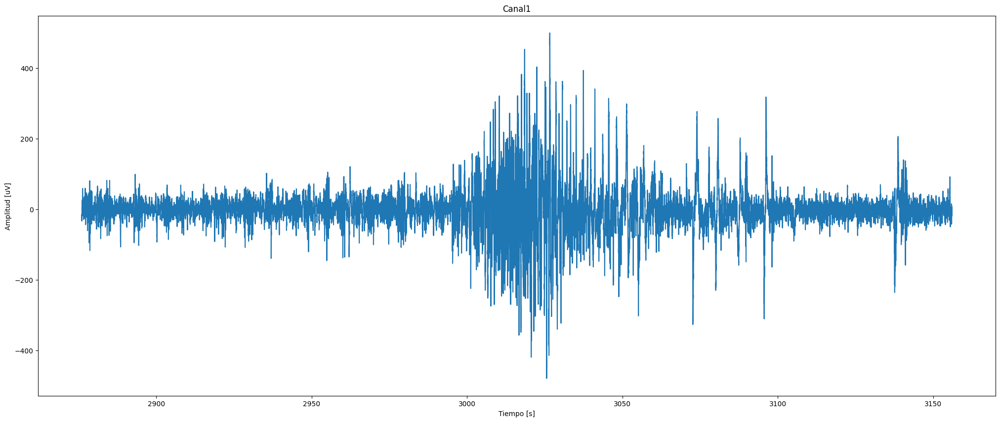

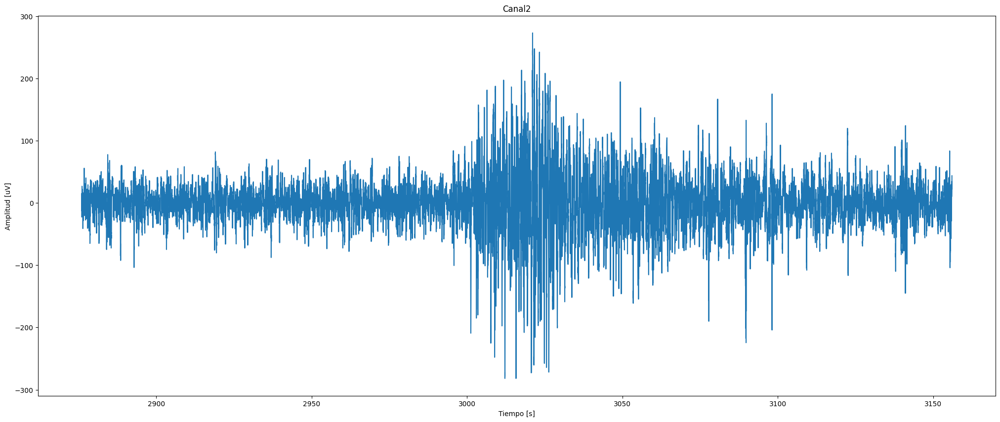

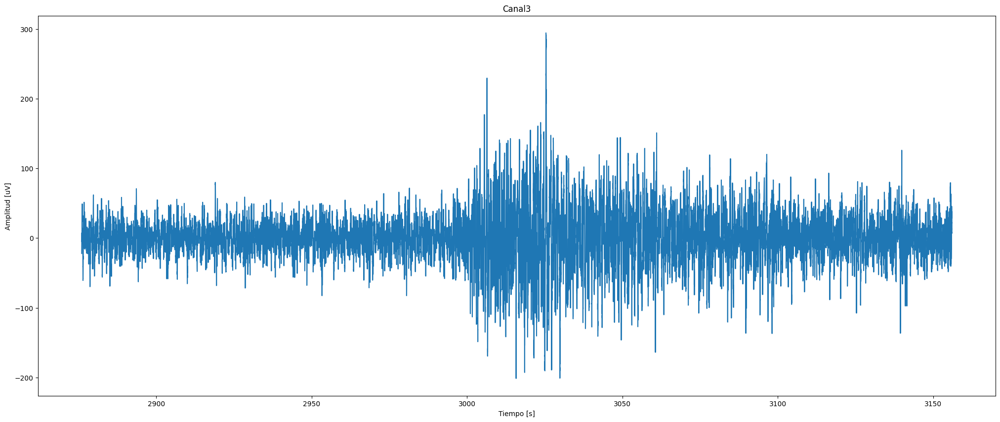

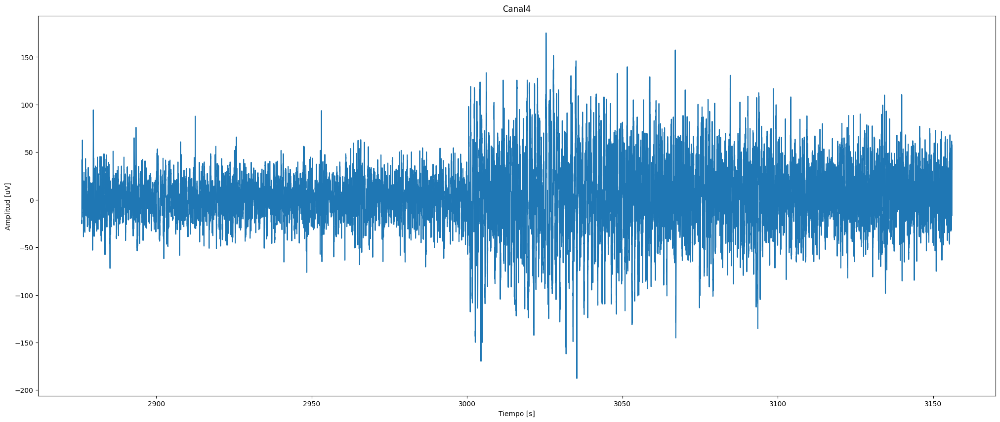

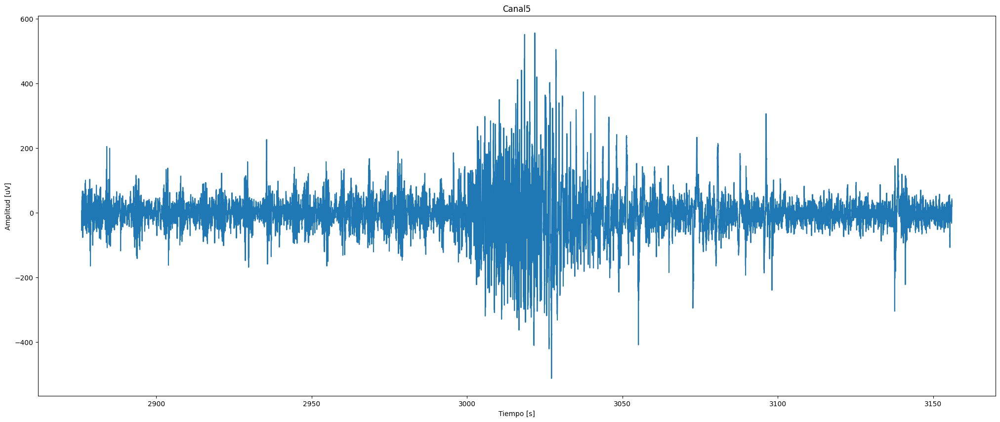

...

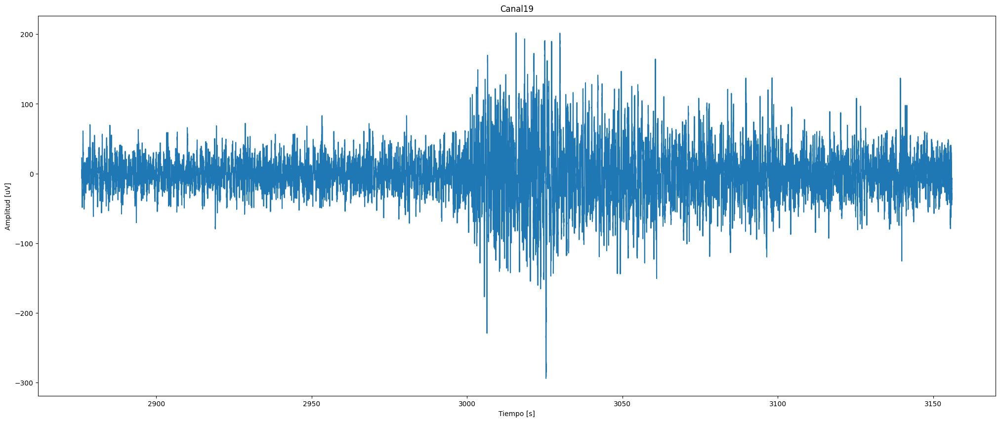

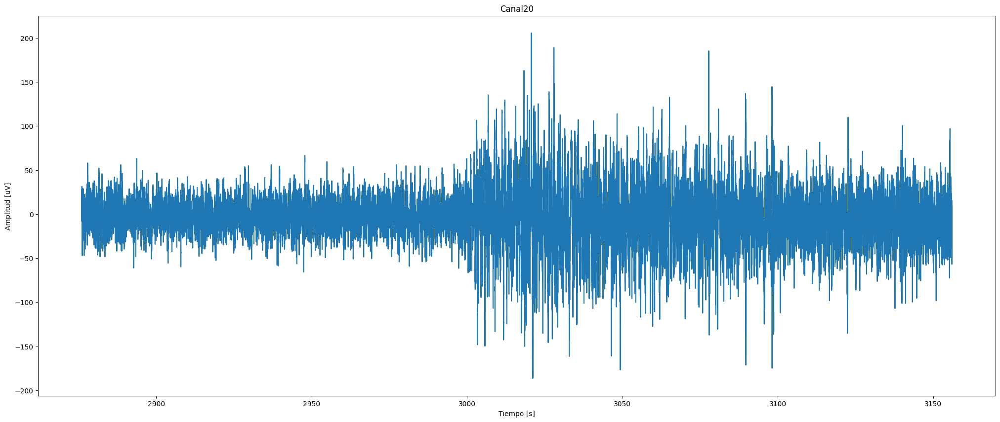

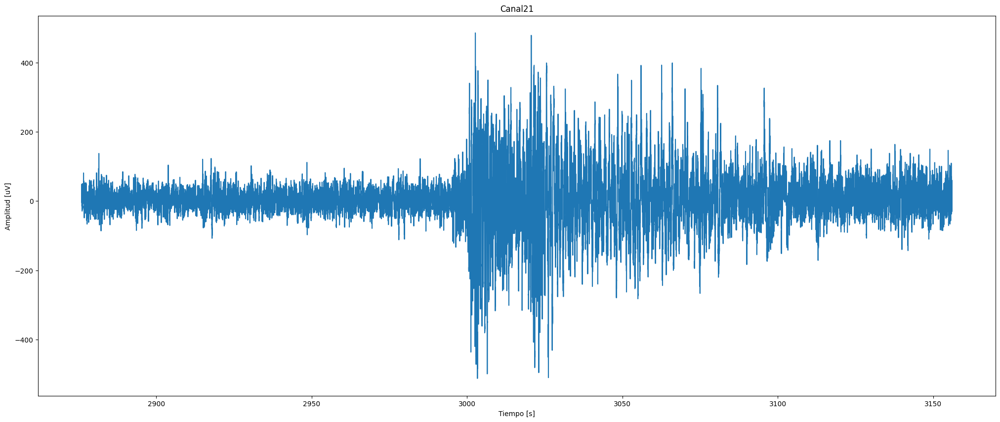

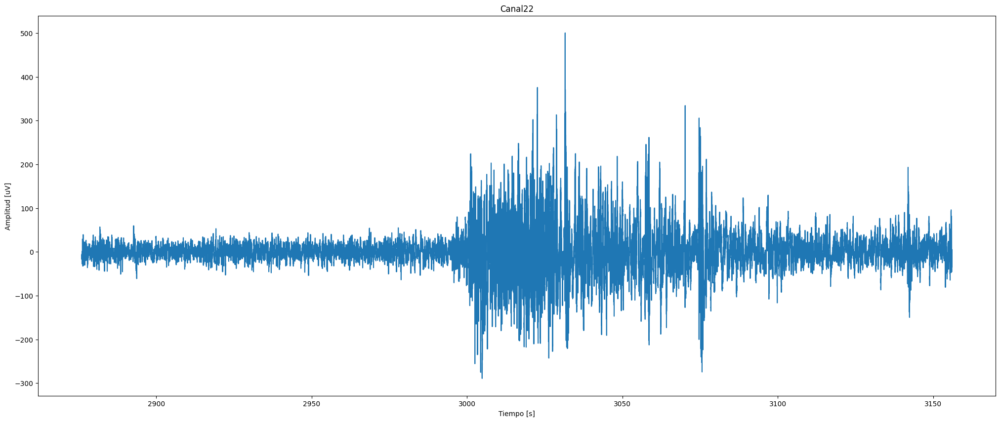

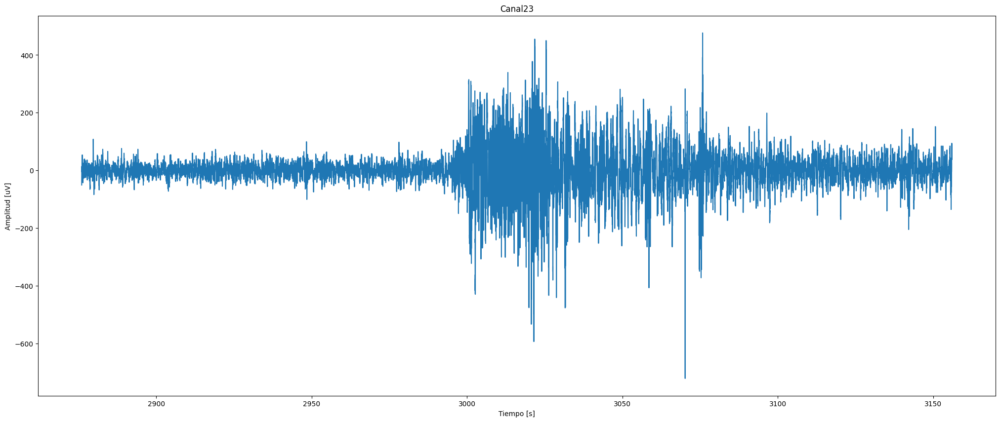

In [ ]:
for c in canales_mat:
  # Creo y muestro una nueva figura por canal
  plt.figure(figsize=(25,10))
  titulo = 'Canal' + str(c)
  plt.plot(t_mat, x_mat[c-1])
  plt.xlabel('Tiempo [s]')
  plt.ylabel('Amplitud [uV]')
  plt.title(titulo)
  plt.show()

Podemos ver cómo, si bien las señales se van modificando canal a canal, se ve un cambio sincronizado en la actividad de todos los canales. La consistencia del cambio entre canales sugiere una fuente común o un evento generalizado en el sistema de registro.

### Gráfico mariposa

Un gráfico mariposa (o butterfly plot) en EEG es una visualización donde todas las señales de los distintos canales se superponen en una misma figura. En lugar de mostrar cada canal por separado, como en un gráfico multicanal con múltiples subplots, el gráfico mariposa traza todas las señales en el mismo eje temporal, usando líneas delgadas (a veces semitransparentes) para distinguirlas.

Se usa para ver rápidamente la sincronía entre canales y observar patrones globales en la actividad cerebral.

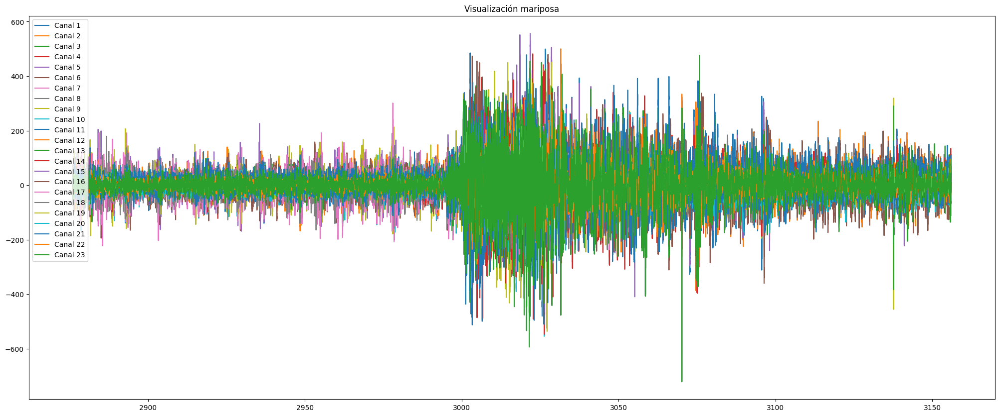

In [ ]:
# Creo una unica figura y voy agregando cada nueva curva por canal y la muestro al final
plt.figure(figsize=(25,10))
for c in canales_mat:
  plt.plot(t_mat, x_mat[c-1], label=f'Canal {c}')
plt.title('Visualización mariposa')
plt.legend(loc='upper left')
plt.show()

### Canales juntos

También podemos graficar todos los canales en una misma figura pero desplegados en el eje verticalpara poder compararlos más facilmente. La separación vertical dependerá de los valores de la señal para que no se superpongan.

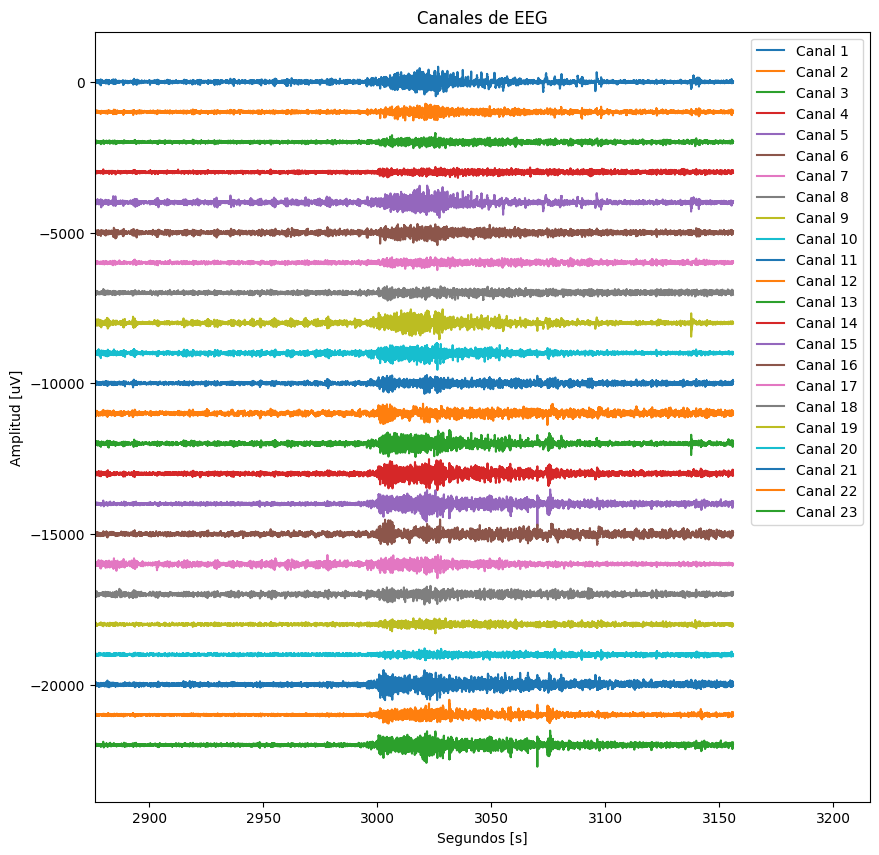

In [ ]:
# Creo una unica figura pero al ir agregando las curvas de los nuevos canales, las voy desplazando en el eje vertical
plt.figure(figsize=(10,10))
i = 0
spacing = 1000 # las grafico cada 1000
for c in canales_mat:
  plt.plot(t_mat,x_mat[c-1]-i, label = f'Canal {c}')
  i += spacing
plt.xlabel('Segundos [s]')
plt.ylabel('Amplitud [uV]')
plt.xlim([t_mat[0],t_mat[-1]+60]) # dejo un margen al final para no superponer la leyenda sobre las señales
plt.title('Canales de EEG')
plt.legend(loc = 'upper right')
plt.show()

### MNE

Ahora veamos cómo podemos visualizar los canales del objeto raw que generamos a partir del edf.

Podemos utilizar directamente la matriz de datos y el vector de tiempos como obtuvimos antes y graficarlo como hicimos anteriormente, o podemos usar funciones de MNE.

In [ ]:
data_edf, times_edf = raw_edf_0[:]
cant_canales_edf = data_edf.shape[0]

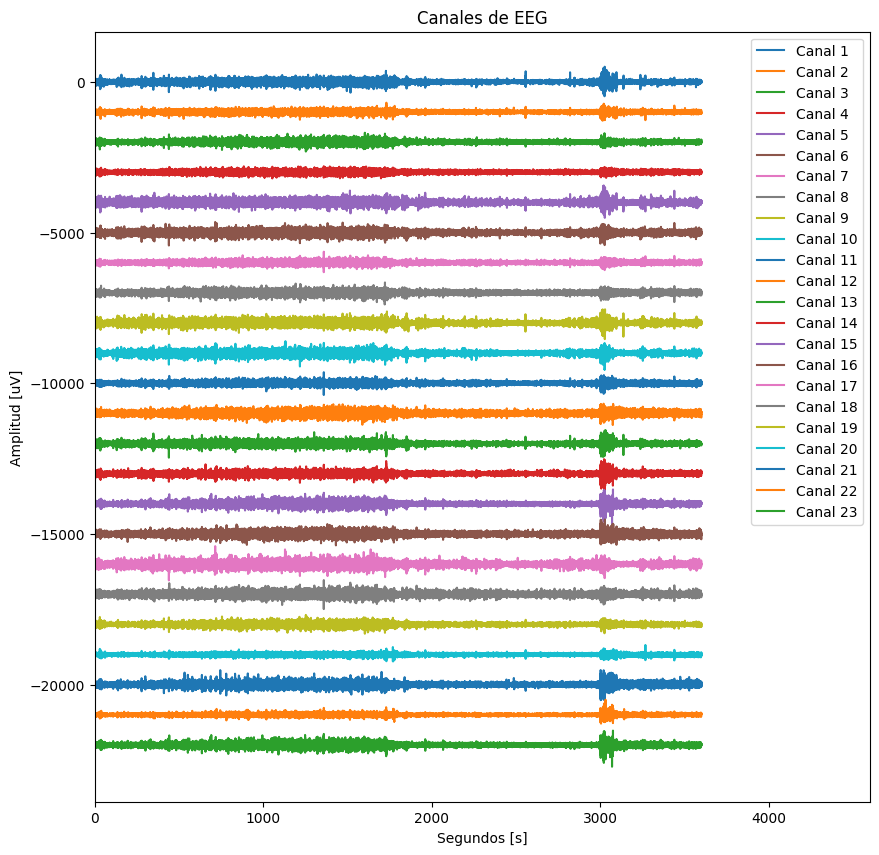

In [ ]:
canales_edf = np.arange(0,cant_canales_edf)+1

plt.figure(figsize=(10,10))
i = 0
spacing = 1000
for c in canales_edf:
  plt.plot(times_edf, data_edf[c-1]*1e6-i, label = f'Canal {c}')
  i += spacing
plt.xlabel('Segundos [s]')
plt.ylabel('Amplitud [uV]')
plt.xlim([times_edf[0],times_edf[-1]+1000])
plt.title('Canales de EEG')
plt.legend(loc = 'upper right')
plt.show()

La función raw.plot() de MNE genera una visualización interactiva del EEG contenida en el objeto Raw. Abre una ventana gráfica interactiva (GUI) basada en matplotlib y un backend gráfico como Qt o Tk, que permiten manejar eventos del mouse y del teclado (scroll, zoom, clics, etc.).

Permite ver múltiples canales simultáneamente, desplazarse por el tiempo, hacer zoom, ajustar el escalado de amplitud, seleccionar y marcar canales como “malos” (bad channels), detectar artefactos de forma visual, ver o agregar anotaciones... Es ideal para una exploración visual inicial de la calidad de la señal y sus características temporales.

Pero como Colab no puede abrir esa ventana, vamos a ver solo la primer ventana de forma estática. Por eso, vamos a probarlo usando VS Code.

Using matplotlib as 2D backend.


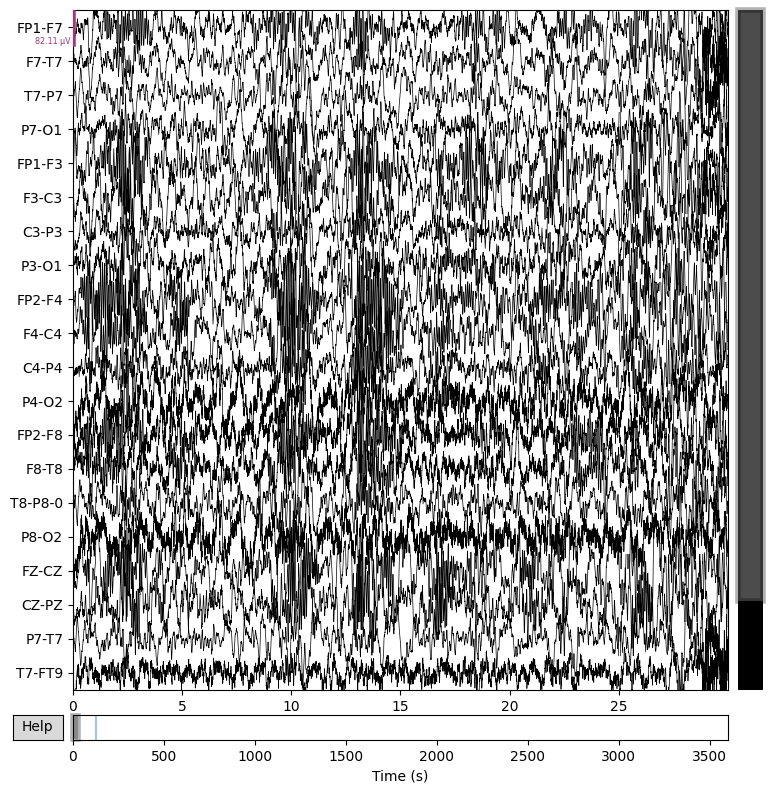

In [ ]:
raw_edf_0.plot(duration=30, scalings='auto') # mostramos todos los canales, cada ventanas de 30 segundos y el escalado automático
plt.show()

Con las flechas podemos desplazarnos por la señal, con el '+' y '-' podemos agrandar o disminuir la escala de amplitud, con 'A' abrimos el panel de anotaciones, podemos marcar canales como bad al silenciarlos...

Podemos seleccionar solo algunos canales para mostrar usando picks.

In [ ]:
raw_edf_0.ch_names

['FP1-F7',
 'F7-T7',
 'T7-P7',
 'P7-O1',
 'FP1-F3',
 'F3-C3',
 'C3-P3',
 'P3-O1',
 'FP2-F4',
 'F4-C4',
 'C4-P4',
 'P4-O2',
 'FP2-F8',
 'F8-T8',
 'T8-P8-0',
 'P8-O2',
 'FZ-CZ',
 'CZ-PZ',
 'P7-T7',
 'T7-FT9',
 'FT9-FT10',
 'FT10-T8',
 'T8-P8-1']

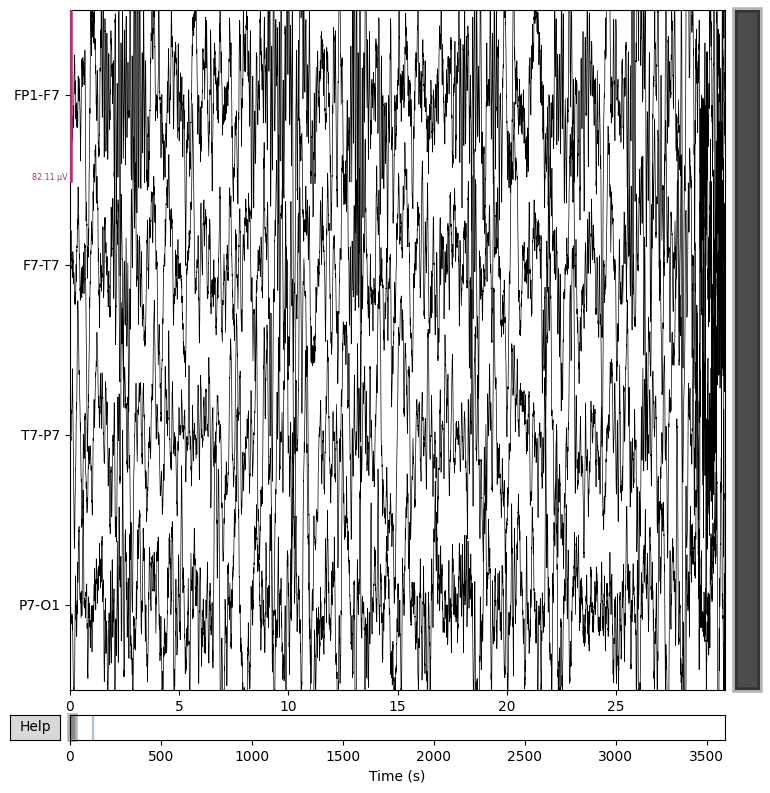

In [ ]:
raw_edf_0.plot(picks=['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1'], duration=30, scalings='auto') # seleccionamos solo algunos canales
plt.show()

O podemos usar n_channels para mostrar unicamnete una cantidad de canales.

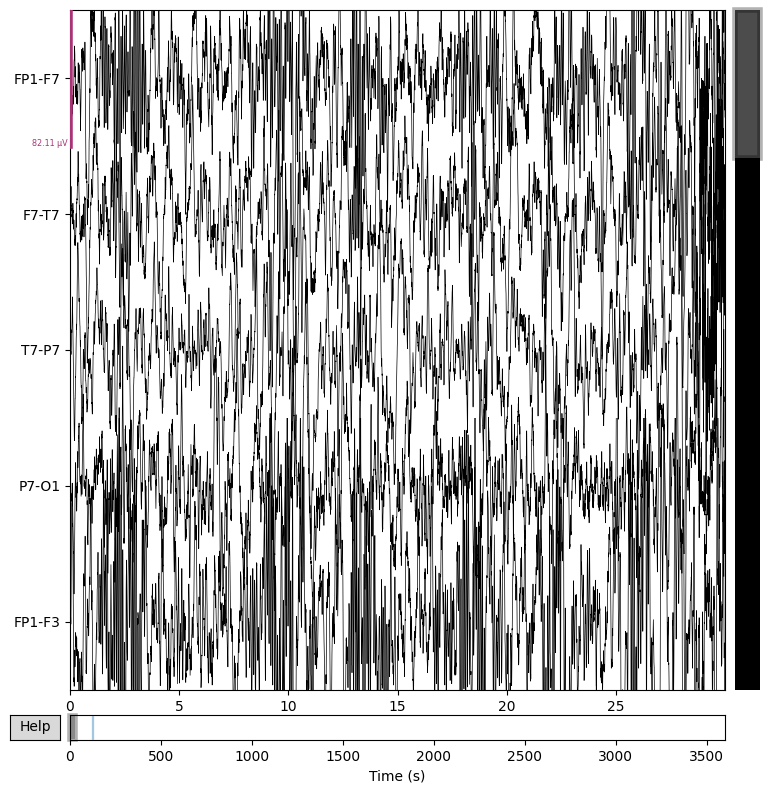

In [ ]:
raw_edf_0.plot(n_channels=5, duration=30, scalings='auto') # seleccionamos solo algunos canales
plt.show()

`.plot()` separa las señales verticalmente pero podríamos usar el modo `butterfly=True` para verlas superpuestas.

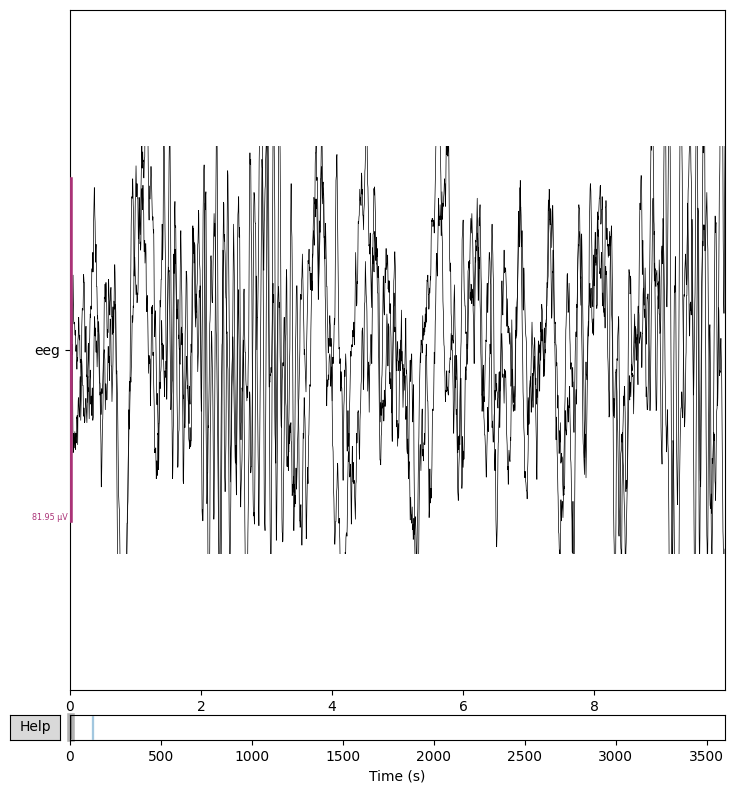

In [ ]:
raw_edf_0.plot(picks=['FP1-F7', 'F7-T7'], duration=10, scalings='auto', butterfly=True) # seleccionamos solo algunos canales
plt.show()

Podemos visualizar las anotaciones.

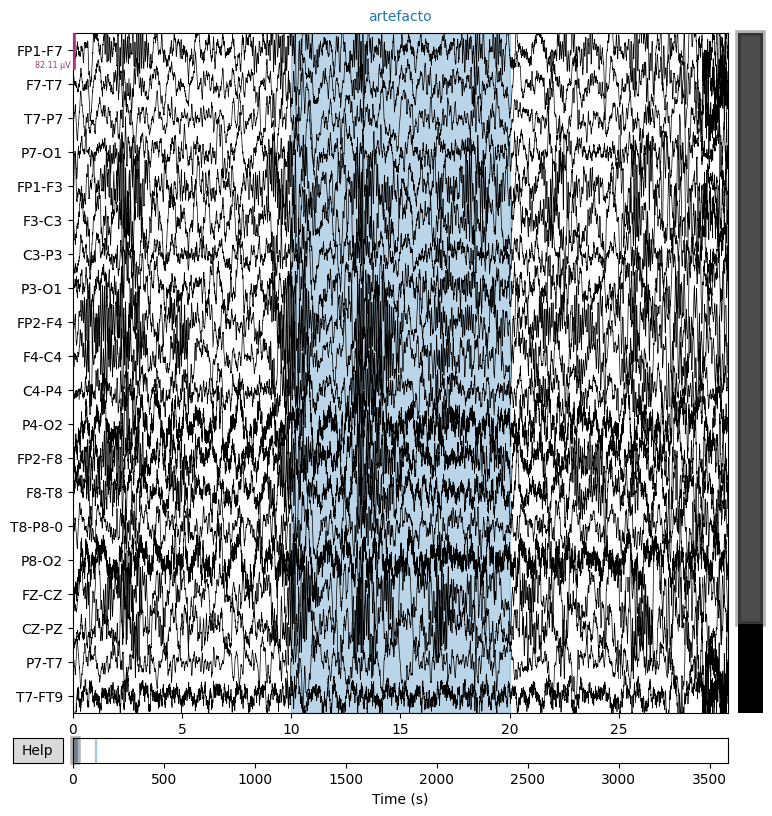

In [ ]:
raw_edf_0.annotations.append(onset=10, duration=10, description='artefacto')
raw_edf_0.plot(duration=30, scalings='auto')
plt.show()

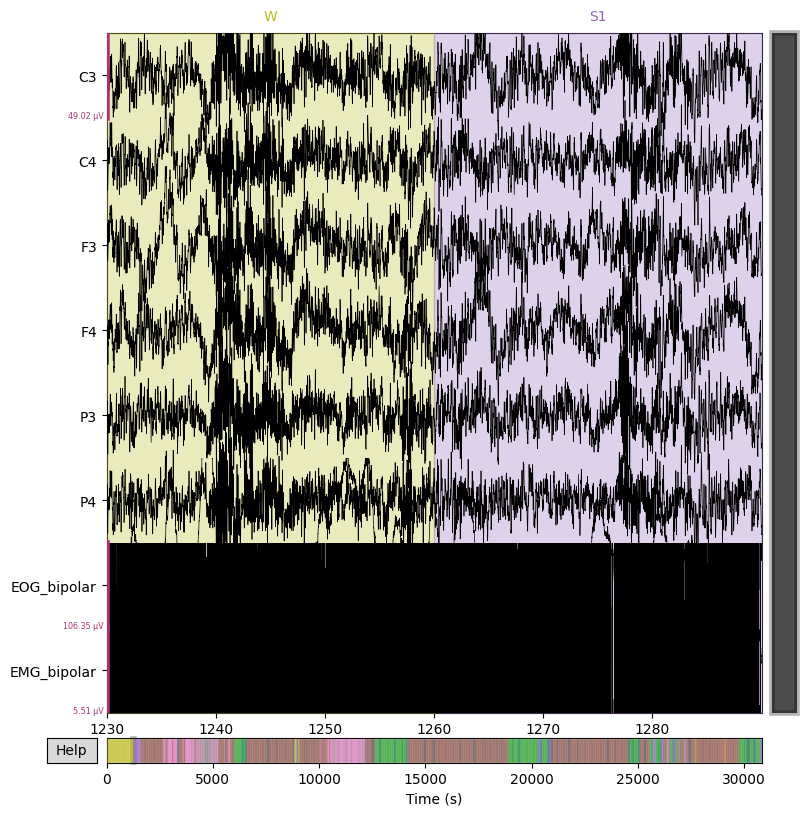

In [ ]:
raw_vhdr_0.plot(start=41*30, duration=30*2, scalings='auto')
plt.show()

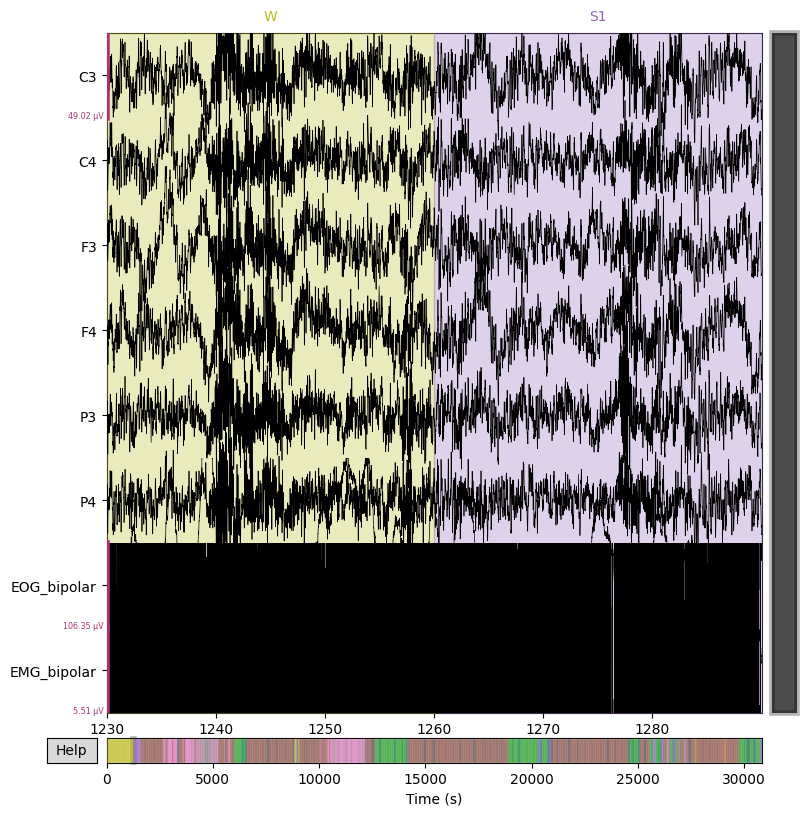

In [ ]:
raw_vhdr_0.plot(start=41*30, duration=30*2, scalings='auto')
plt.show()

Podemos cambiar el scaling de los distintos tipos de señales.

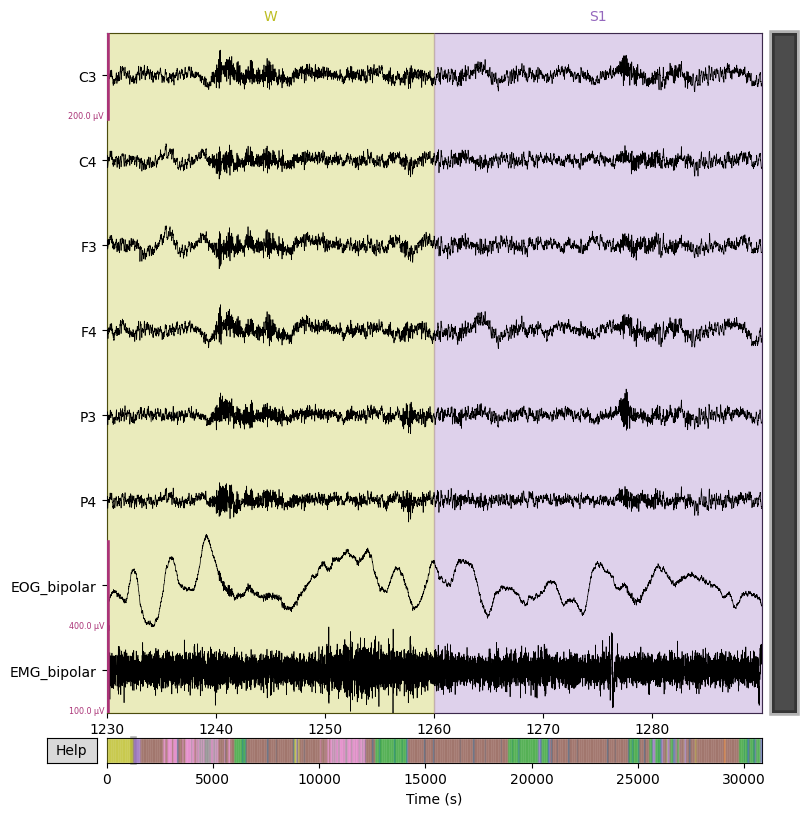

In [ ]:
scalings = {
    'eeg': 100e-6,  # Escala para canales EEG
    'eog': 200e-6,  # Escala para canales EOG
    'emg': 50e-6  # Escala para canales EMG
}

raw_vhdr_0.plot(start=41*30, duration=30*2, scalings=scalings)
plt.show()

Podemos cambiar el scaling de los distintos tipos de señales.

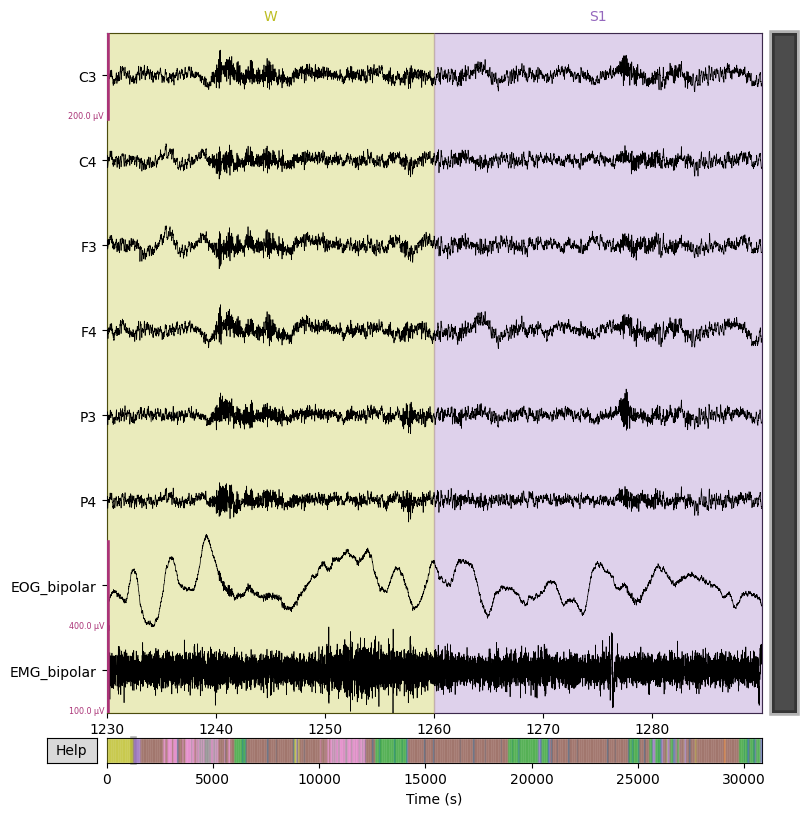

In [ ]:
scalings = {
    'eeg': 100e-6,  # Escala para canales EEG
    'eog': 200e-6,  # Escala para canales EOG
    'emg': 50e-6  # Escala para canales EMG
}

raw_vhdr_0.plot(start=41*30, duration=30*2, scalings=scalings)
plt.show()

## ESPECTRO DEL EEG

Podemos aplicar la Transformada Rápida de Fourier (FFT) con la función `fft` del módulo fft de scipy ([Fast Fourier Transform](https://docs.scipy.org/doc/scipy/tutorial/fft.html)).

Podemos estimar la PSD (densidad espectral de potencia) usando el método de Welch mediante la función `welch` del módulo signal de scipy ([scipy.signal.welch()](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.welch.html)). El método de Welch estima la densidad espectral de potencia dividiendo la señal en segmentos superpuestos, aplicando una ventana a cada segmento, calculando su periodograma y promediando los resultados.

![Welch](https://onlinebme.com/wp-content/uploads/2024/06/power-spectral-density-calculation-using-welch-method.jpg)

Los parámetros `window`, `nperseg`, `noverlap` y `nfft` de la función `scipy.signal.welch` permiten ajustar el análisis espectral en el método de Welch.
- `window` define el tipo de ventana que se aplica a cada segmento (por default, 'hann'), lo que influye en la resolución espectral y la reducción de fugas espectrales.
- `nperseg` determina la longitud de cada segmento, afectando la resolución en frecuencia: segmentos más largos ofrecen mejor resolución pero requieren mayor estacionariedad.
- `noverlap` indica cuántas muestras se superponen entre segmentos consecutivos, lo que mejora la suavidad del espectro promedio.
- `nfft` especifica el número de puntos usados en la transformada de Fourier, controlando la resolución del espectro interpolado y permitiendo zero-padding si se desea aumentar la densidad de puntos en frecuencia.


Definamos igual una función para calcular el PSD por welch.

In [ ]:
def welch_per(x, fs, nperseg, nfft, noverlap):
  """
  Implementa el cálculo del espectro de densidad de potencia (PSD) usando el método de Welch con segmentos solapados (overlapping).

  Parámetros:
  x: señal
  fs: frecuencia de muestreo en Hz
  nperseg: cantidad de muestras por segmento (largo de ventana)
  nfft: número de puntos de la FFT
  noverlap: cantidad de muestras que se superponen

  window: utiliza hanning
  """
  step = int(nperseg - noverlap)                     # Avance entre ventanas
  win = scipy.signal.windows.hann(nperseg)        # Ventana de Hanning --> devuelve la ventana de nperseg muestras

  psd = np.zeros(nfft)                          # Inicializa PSD acumulado
  count = 0                                     # Contador de segmentos para dividir despues la suma

  for start in range(0, len(x) - nperseg + 1, step):
    segment = x[start:start + nperseg]        # Extrae segmento con solapamiento
    windowed = segment * win                  # Aplica ventana
    fft_segment = np.fft.fft(windowed, n=nfft) # Es two sided (incluye tanto las frecuencias positivas como las negativas)
    psd += np.abs(fft_segment)**2 / nfft     # Calcula el periodograma (cuadrado del valor absoluto de la DTFT) y lo acumula --> se divide por nfft que es igual anperseg a menos que se haga zero padding
    count += 1

  psd /= count                                  # Obtiene el promedio dividiendo la suma sobre la cantidad de segmentos
  psd = psd[:nfft // 2] *2                      # Me quedo solo con la mitad positiva y multiplico por 2 para conservar la energía total
  freq = np.linspace(0, fs / 2, nfft // 2)      # Armo el eje de frecuencias --> hasta fs/2 por el teorema de Nyquist, con una cantidad de puntos de nfft/2 (porque tengo solo las positivas)

  return freq, psd


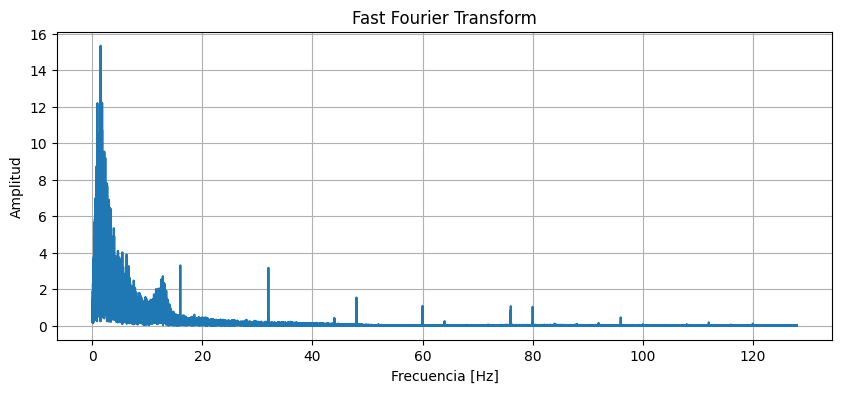

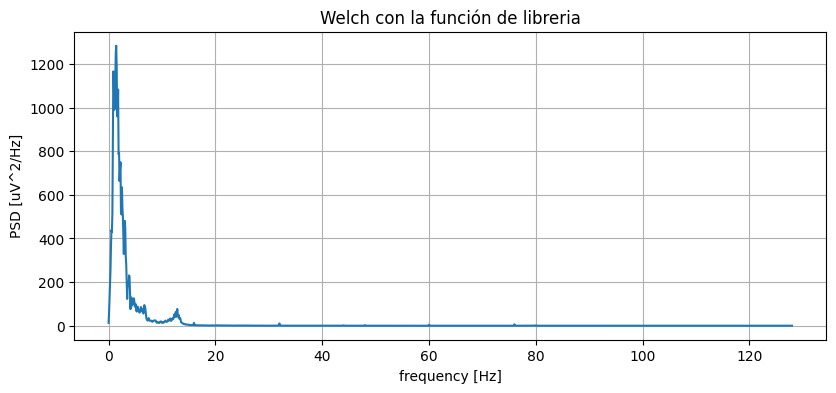

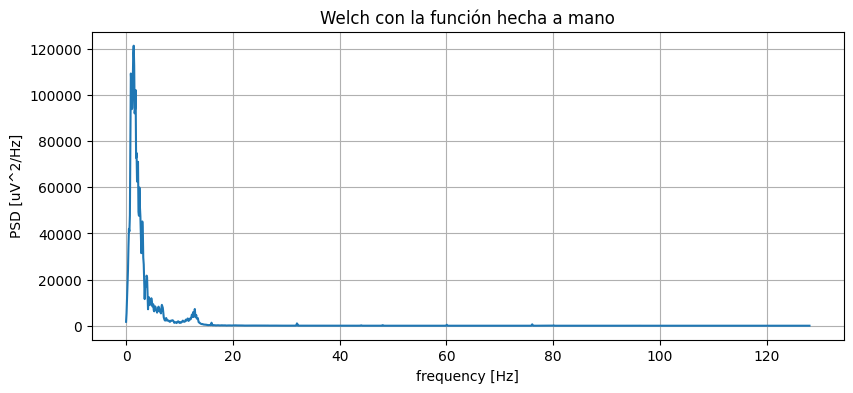

In [ ]:
canal = 18 # Elegimos un canal para analizar

canal_fft = fft(x_mat[canal-1]) # Aplicamos la Transformada Rápida de Fourier (FFT) con la función de scipy al canal seleccionado
canal_fft = canal_fft[:len(canal_fft)//2] # Nos quedamos solo con la mitad positiva del espectro (la FFT es simétrica)
L = canal_fft.shape[0] # L es la longitud del espectro de la mitad que vamos a graficar

f = np.linspace(0,fs_mat/2,L) # Generamos un vector de frecuencias desde 0 hasta fs/2 (Nyquist) de L puntos
y = 2.0/L * np.abs(canal_fft) # Calculamos la magnitud del espectro (módulo de los números complejos resultantes de la FFT y normalizada)
                              # L es la cantidad de puntos en la mitad positiva de la FFT.
                              # * 2.0 compensa  el hecho de que tomamos solo media FFT (la parte positiva), y entonces duplicamos las amplitudes para conservar la energía total

# Graficamos el espectro usando la FFT
plt.figure(figsize = (10,4))
plt.title('Fast Fourier Transform')
plt.plot(f,y)
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Amplitud')
plt.grid()
plt.show()

# Calculamos la PSD (densidad espectral de potencia) usando el método de Welch
nper = int(len(x_mat[canal-1])//25) # Definimos el nperseg como 1/25 del total de muestras del canal
f, Pxx_den = scipy.signal.welch(x_mat[canal-1], fs_mat, noverlap=nper/2, nperseg=nper) # Aplicamos el método de Welch (noverlap: cantidad de puntos de solapamiento entre ventanas (aquí 50%))

# Graficamos la PSD obtenida por Welch
plt.figure(figsize = (9.7,4))
plt.plot(f, Pxx_den)
plt.xlabel('frequency [Hz]')
plt.ylabel('PSD [uV^2/Hz]')
plt.title('Welch con la función de libreria')
plt.grid()
plt.show()


f, psd = welch_per(x=x_mat[canal-1], fs=fs_mat, nperseg=nper, nfft=nper, noverlap=nper/2)

# Graficamos la PSD obtenida por la funcion de Welch
plt.figure(figsize = (9.7,4))
plt.plot(f, psd)
plt.xlabel('frequency [Hz]')
plt.ylabel('PSD [uV^2/Hz]')
plt.title('Welch con la función hecha a mano')
plt.grid()
plt.show()


<font color = "yellow">¿A qué se deben las diferencias entre la FFT y Welch?</font>

- **FFT**: Espectro de magnitud de una única ventana (toda la señal) → Alta resolución en frecuencia (porque se usa el largo completo de la señal), pero muy sensible al ruido y a la variabilidad (ya que el ruido y las variaciones transitorias asociadas a la no estacionariedad de la señal afectan directamente el espectro).

- **Welch**: Promedio de espectros calculados en ventanas (segmentos pequeños enventanados y solapados) → Más robusto, menos variable y más suave (menos ruido), pero con menor resolución en frecuencia debido a la segmentación en segmentos pequeños y al promediado, que suaviza los detalles más finos.

En resumen, la FFT permite observar detalles finos en el dominio de la frecuencia, aunque con mayor variabilidad, mientras que Welch ofrece una representación más estable y confiable de la distribución de potencia en frecuencia, a costa de una menor resolución.

<font color = "yellow">¿Qué pasa si cambiamos `nperseg` y el `noverlap`?</font>

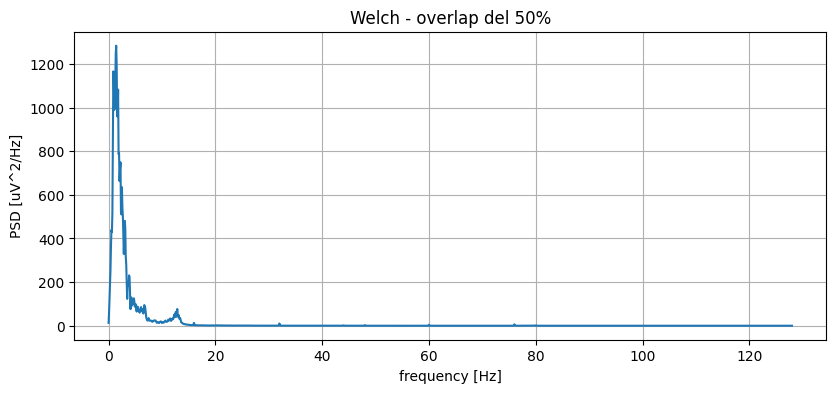

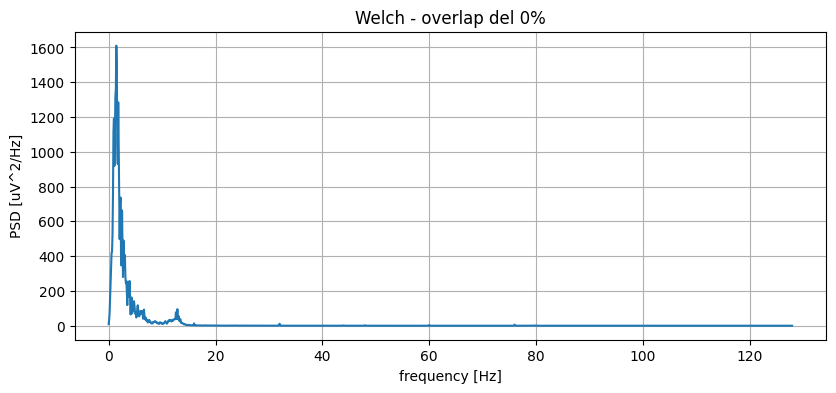

In [ ]:
# Comparamos 50% contra 0% de overlap

f1, Pxx_den1 = scipy.signal.welch(x_mat[canal-1], fs_mat, noverlap=nper*0.5, nperseg=nper)
f2, Pxx_den2 = scipy.signal.welch(x_mat[canal-1], fs_mat, noverlap=nper*0, nperseg=nper)

plt.figure(figsize = (9.7,4))
plt.plot(f1, Pxx_den1)
plt.xlabel('frequency [Hz]')
plt.ylabel('PSD [uV^2/Hz]')
plt.title('Welch - overlap del 50%')
plt.grid()
plt.show()

plt.figure(figsize = (9.7,4))
plt.plot(f2, Pxx_den2)
plt.xlabel('frequency [Hz]')
plt.ylabel('PSD [uV^2/Hz]')
plt.title('Welch - overlap del 0%')
plt.grid()
plt.show()

- Mayor solapamiento = curva más suave y estable.
- Menor solapamiento = curva más ruidosa y variable.

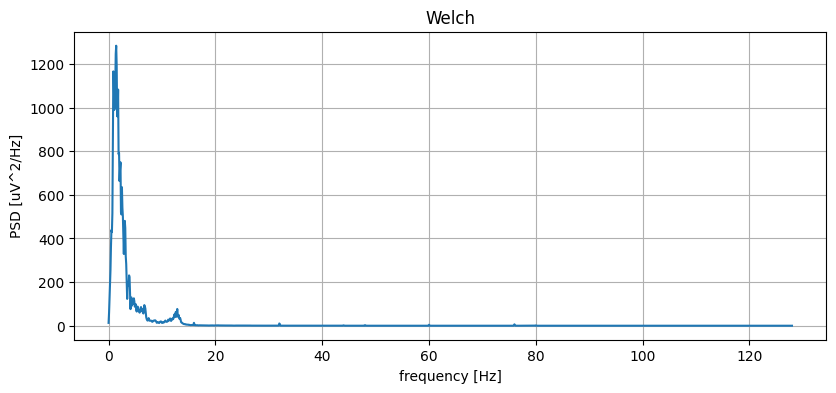

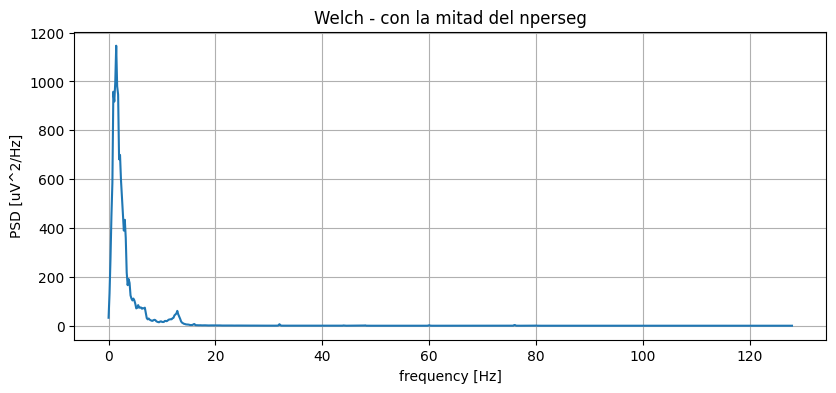

In [ ]:
# Comparamos el nperseg contra su mitad
nper = int(len(x_mat[canal-1])//25)
f1, Pxx_den1 = scipy.signal.welch(x_mat[canal-1], fs_mat, noverlap=nper/2, nperseg=nper)
nper //= 2
f2, Pxx_den2 = scipy.signal.welch(x_mat[canal-1], fs_mat, noverlap=nper/2, nperseg=nper)

plt.figure(figsize = (9.7,4))
plt.plot(f1, Pxx_den1)
plt.xlabel('frequency [Hz]')
plt.ylabel('PSD [uV^2/Hz]')
plt.title('Welch')
plt.grid()
plt.show()

plt.figure(figsize = (9.7,4))
plt.plot(f2, Pxx_den2)
plt.xlabel('frequency [Hz]')
plt.ylabel('PSD [uV^2/Hz]')
plt.title('Welch - con la mitad del nperseg')
plt.grid()
plt.show()

- Ventanas más largas = mejor detalle en frecuencia, pero más ruido.
- Ventanas más cortas = peor detalle en frecuencia, pero más suavidad.

## ELIMINACIÓN DE RUIDO EN EEG

El EEG se suele filtrar con un filtro pasa bandas (por ejemplo, entre 0.5 y 35 Hz, aunque depende del objetivo) para conservar las frecuencias de interés y eliminar componentes no deseadas como el ruido de línea o los artefactos de baja frecuencia, como también un filtro notch en 50Hz para eliminar el ruido de línea. Además se analiza cada señal particular para ver si requiere algún filtro específico más.

En general, se utilizan filtros IIR (respuesta infinita al impulso), ya que permiten lograr pendientes más pronunciadas con menor orden, a diferencia de los filtros FIR, que requieren muchos más coeficientes para obtener una pendiente similar.

En particular, se suele usar el filtro Butterworth (conocido como “Butter”) por su respuesta en frecuencia lo más plana posible en la banda pasante. Esto significa que no introduce distorsiones bruscas en la amplitud de las señales dentro del rango de interés.

Aunque el filtro Butter no tiene una fase completamente lineal (como los FIR), si se aplica hacia adelante y hacia atrás (por ejemplo, con `filtfilt` en Python), se elimina el desfase y se logra una respuesta de fase cero. Esto es ideal cuando se quiere evitar el desplazamiento temporal de eventos importantes, como las ondas lentas o los complejos K.


Vamos a usar un filtro Butterworth mediante la función [scipy.signal.butter()](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.butter.html)

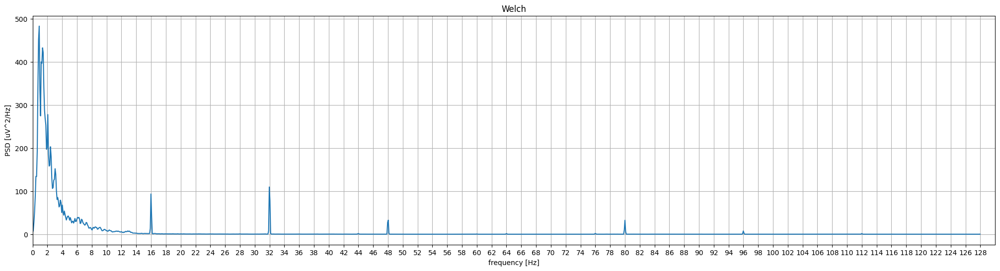

In [ ]:
canal = 4 # seleccionamos un canal

# Calculamos la PSD (densidad espectral de potencia) usando el método de Welch
nper = int(len(x_mat[canal-1])//25) # Definimos el nperseg (el número de puntos por segmento) como 1/25 del total de muestras del canal
f, Pxx_den = scipy.signal.welch(x_mat[canal-1], fs_mat, noverlap=nper/2, nperseg=nper) # Aplicamos el método de Welch (noverlap: cantidad de puntos de solapamiento entre ventanas (aquí 50%))

# Graficamos la PSD obtenida por Welch
plt.figure(figsize = (25,6))
plt.plot(f, Pxx_den)
plt.xlabel('frequency [Hz]')
plt.ylabel('PSD [uV^2/Hz]')
plt.title('Welch')
plt.xlim(0, 130)
plt.xticks(np.arange(0,130,2))
plt.grid()
plt.show()

Eliminemos el pico en 16Hz aplicando un filtro rechaza banda con frecuencias de corte 15 y 17 Hz, y grafiquemos la señal original y la filtrada, junto con la diferencia entre las señales.

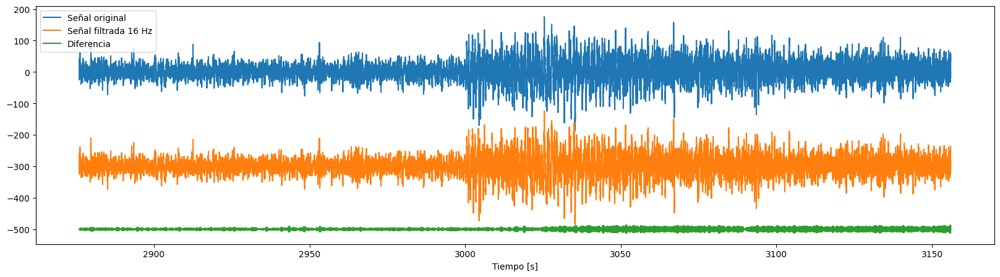

In [ ]:
wn = [15,17] #Queremos eliminar el pico de 16Hz --> definimos las f de corte en 15 y 17

# Se define el orden del filtro --> Un orden mayor genera una transición más abrupta entre la banda pasante y la banda atenuada, pero también puede introducir más distorsión o inestabilidad.
N = 5 # se define N=5, que es un valor moderado.

[b,a] = scipy.signal.butter(N, wn, btype = 'bandstop', fs = fs_mat) # usamos signal.butter para diseñar el filtro con tipo de filtro 'bandstop'

filtrada_1 = scipy.signal.filtfilt(b,a,x_mat[canal-1])  # aplicamos el filtro hacia delante y hacia atras

diferencia = x_mat[canal-1]-filtrada_1

# Graficamos las señales
plt.figure(figsize=(20,5))
plt.plot(t_mat,x_mat[canal-1], label='Señal original')
plt.plot(t_mat,filtrada_1 - 300, label='Señal filtrada 16 Hz')
plt.plot(t_mat,diferencia-500, label='Diferencia')
plt.xlabel('Tiempo [s]')
plt.legend(loc='upper left')
plt.show()

Hagamos zoom en alguna ventana de la señal para ver mejor las diferencias.

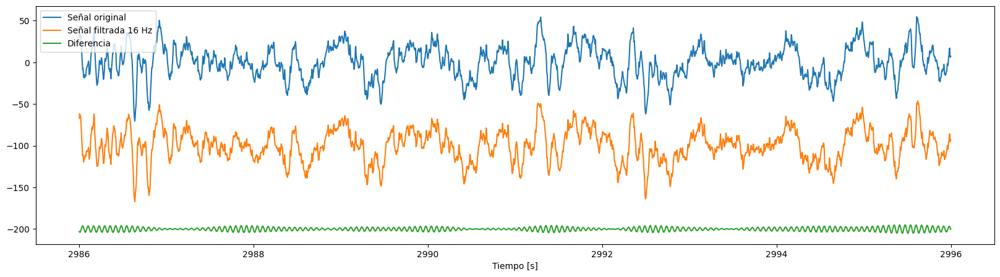

In [ ]:
pos_inic = 110 * fs_mat
pos_fin = 120 * fs_mat

plt.figure(figsize=(20,5))
plt.plot(t_mat[pos_inic:pos_fin], x_mat[canal-1][pos_inic:pos_fin], label='Señal original')
plt.plot(t_mat[pos_inic:pos_fin], filtrada_1[pos_inic:pos_fin]-100, label='Señal filtrada 16 Hz')
plt.plot(t_mat[pos_inic:pos_fin], diferencia[pos_inic:pos_fin]-200, label='Diferencia')
plt.xlabel('Tiempo [s]')
plt.legend(loc='upper left')
plt.show()

Veamos los espectros de la señal original y la filtrada superpuestos, y el espectro de la diferencia.

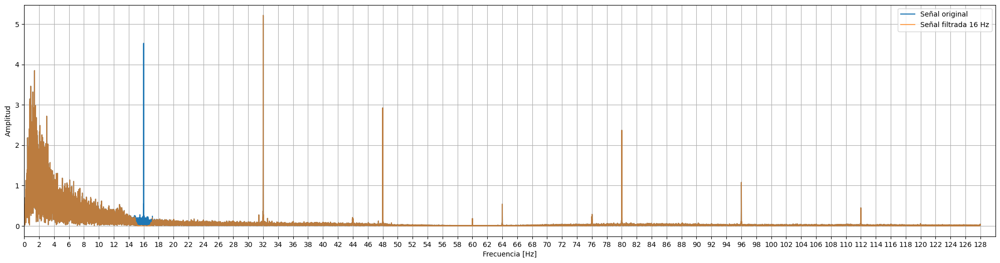

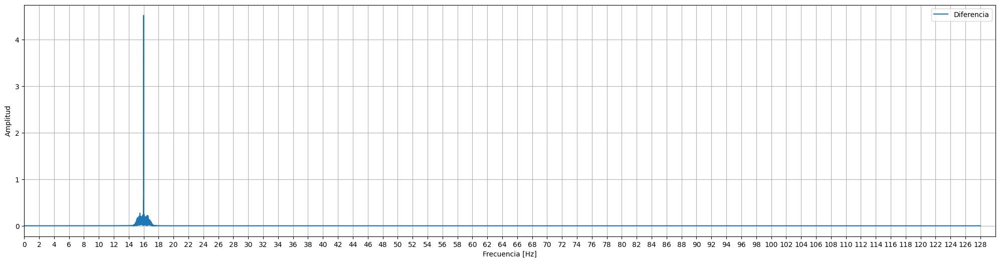

In [ ]:
# FFT de la señal original y la filtrada superpuestas
filtrada_1_fft = fft(filtrada_1)
canal_fft = fft(x_mat[canal-1])

L = filtrada_1_fft.shape[0]

f = np.linspace(0,1,L) * fs_mat
y = 2.0/L * np.abs(canal_fft[0:int(L/2)])

f_filt = np.linspace(0,1,L) * fs_mat
y_filt = 2.0/L * np.abs(filtrada_1_fft[0:int(L/2)])

plt.figure(figsize = (25,6))
plt.plot(f[:int(L/2)],y, label = 'Señal original')
plt.plot(f_filt[:int(L/2)],y_filt, alpha=0.7, label = 'Señal filtrada 16 Hz')
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Amplitud')
plt.legend(loc='upper right')
plt.xlim(0, 130)
plt.xticks(np.arange(0,130,2))
plt.grid()
plt.show()


# FFT de la diferencia
diferencia_fft = fft(diferencia)

L = diferencia_fft.shape[0]

f_filt = np.linspace(0,1,L) * fs_mat
y_filt = 2.0/L * np.abs(diferencia_fft[0:int(L/2)])

plt.figure(figsize = (25,6))
plt.plot(f_filt[:int(L/2)],y_filt, label = 'Diferencia')
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Amplitud')
plt.legend(loc='upper right')
plt.xlim(0, 130)
plt.xticks(np.arange(0,130,2))
plt.grid()
plt.show()

Ahora filtremos el pico de 32Hz a la señal ya filtrada. Aplicamos un filtro rechaza banda con frecuencias de corte 31 y 33 Hz.

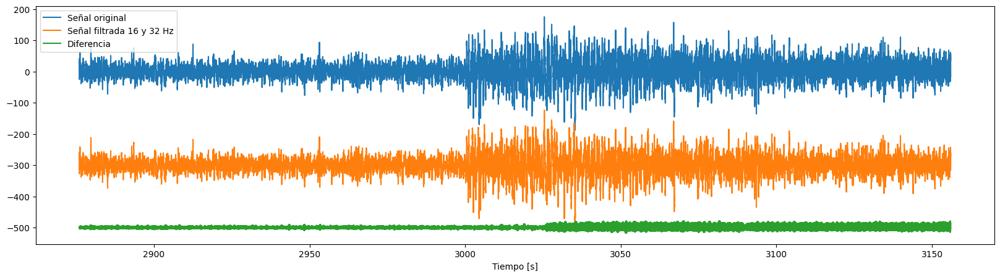

In [ ]:
N = 5 #orden
wn = [31,33] # frecuencias de corte

[b,a] = scipy.signal.butter(N, wn, btype = 'bandstop', output = 'ba', fs = fs_mat) #generamos el filtro

filtrada_2 = scipy.signal.filtfilt(b, a, filtrada_1) # Aplicamos el filtro

diferencia = x_mat[canal-1]-filtrada_2

# Graficamos las señales
plt.figure(figsize=(20,5))
plt.plot(t_mat,x_mat[canal-1], label='Señal original')
plt.plot(t_mat,filtrada_2 - 300, label='Señal filtrada 16 y 32 Hz')
plt.plot(t_mat,diferencia-500, label='Diferencia')
plt.xlabel('Tiempo [s]')
plt.legend(loc='upper left')
plt.show()


Hagamos zoom nuevamente.

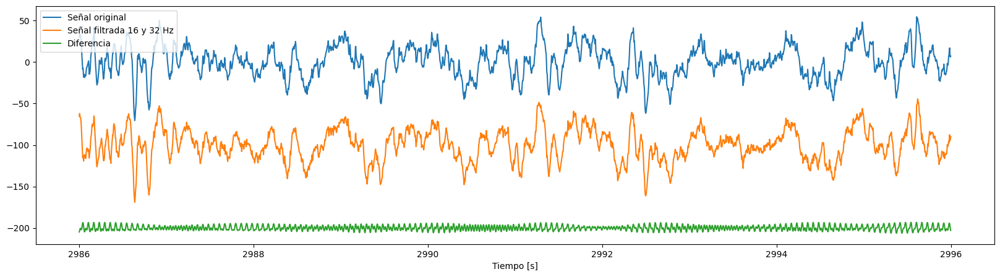

In [ ]:
pos_inic = 110 * fs_mat
pos_fin = 120 * fs_mat

plt.figure(figsize=(20,5))
plt.plot(t_mat[pos_inic:pos_fin], x_mat[canal-1][pos_inic:pos_fin], label='Señal original')
plt.plot(t_mat[pos_inic:pos_fin], filtrada_2[pos_inic:pos_fin]-100, label='Señal filtrada 16 y 32 Hz')
plt.plot(t_mat[pos_inic:pos_fin], diferencia[pos_inic:pos_fin]-200, label='Diferencia')
plt.xlabel('Tiempo [s]')
plt.legend(loc='upper left')
plt.show()

Veamos nuevamente el espectro de la señal original y de la filtrada en 16 y 32 Hz de manera superpuesta, y de la diferencia.

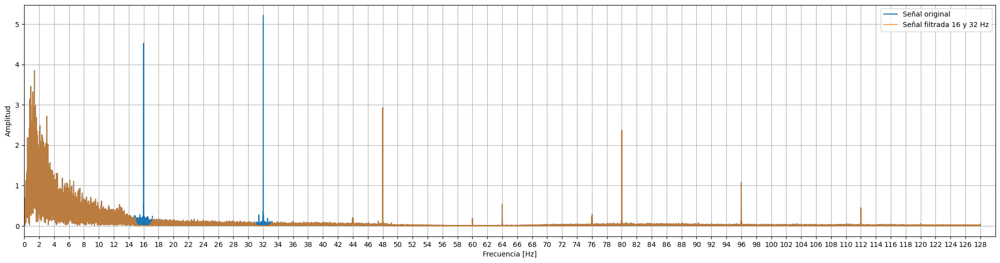

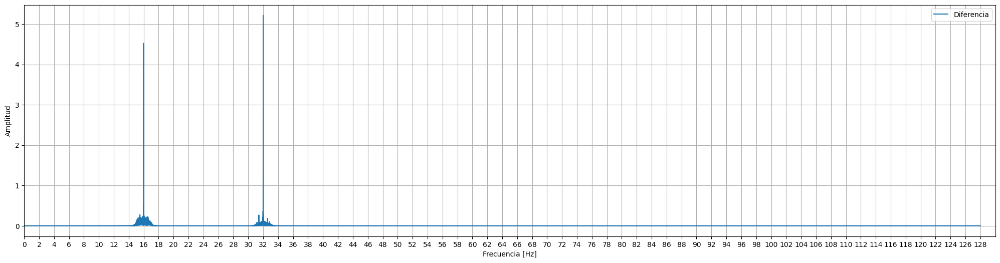

In [ ]:
# FFT de la señal original y la filtrada superpuestas
filtrada_2_fft = fft(filtrada_2)
canal_fft = fft(x_mat[canal-1])

L = filtrada_2_fft.shape[0]

f = np.linspace(0,1,L) * fs_mat
y = 2.0/L * np.abs(canal_fft[0:int(L/2)])

f_filt = np.linspace(0,1,L) * fs_mat
y_filt = 2.0/L * np.abs(filtrada_2_fft[0:int(L/2)])

plt.figure(figsize = (25,6))
plt.plot(f[:int(L/2)],y, label = 'Señal original')
plt.plot(f_filt[:int(L/2)],y_filt, alpha=0.7, label = 'Señal filtrada 16 y 32 Hz')
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Amplitud')
plt.legend(loc='upper right')
plt.xlim(0, 130)
plt.xticks(np.arange(0,130,2))
plt.grid()
plt.show()


# FFT de la diferencia
diferencia_fft = fft(diferencia)

L = diferencia_fft.shape[0]

f_filt = np.linspace(0,1,L) * fs_mat
y_filt = 2.0/L * np.abs(diferencia_fft[0:int(L/2)])

plt.figure(figsize = (25,6))
plt.plot(f_filt[:int(L/2)],y_filt, label = 'Diferencia')
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Amplitud')
plt.legend(loc='upper right')
plt.xlim(0, 130)
plt.xticks(np.arange(0,130,2))
plt.grid()
plt.show()

Así podríamos seguir filtrando los picos de los armónicos en 48, 64, 80, ... Hz. <font color = "yellow">Pero en vez de aplicar tantas veces un Notch, ¿qué filtro nos conviene usar para este tipo de ruido?</font>

Podemos usar un filtro comb notch ([scipy.signal.iircomb()](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.iircomb.html?highlight=comb#scipy.signal.iircomb)) que elimina simultáneamente las frecuencias armónicas de una frecuencia fundamental dada. Apliquems este filtro a la señal original:

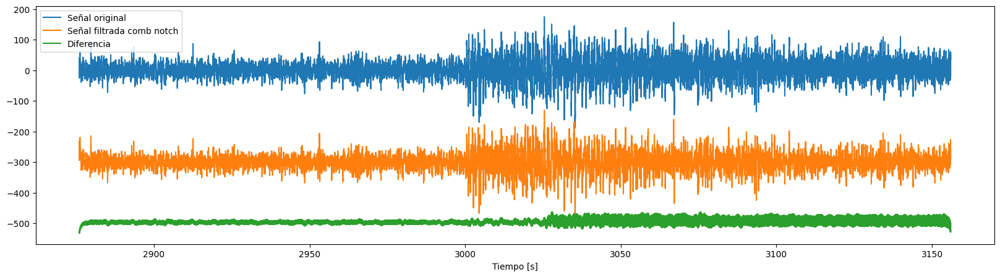

In [ ]:
from scipy.signal import iircomb

w0 = 16 # quiero filtrar las armónicas de 16 Hz
b,a = iircomb(w0=w0, Q=w0/0.5, ftype='notch', fs=fs_mat) # diseño el filtro comb notch con la funcion iircomb de scipy signal para eliminar frecuencias armónicas de 16 Hz (16 Hz, 32 Hz, 48 Hz, 64 Hz, etc.)
                                                    # w0 = recuencia fundamental a suprimir (Hz)
                                                    # Q = Factor de calidad (define el ancho del notch) → Q alto = notch angosto = elimina muy selectivamente; Q bajo = notch ancho = elimina una banda más grande
filtrada = scipy.signal.filtfilt(b, a, x_mat[canal - 1]) # aplico el filtro hacia delante hacia atras a la señal original

diferencia = x_mat[canal-1]-filtrada

# Graficamos las señales
plt.figure(figsize=(20,5))
plt.plot(t_mat,x_mat[canal-1], label='Señal original')
plt.plot(t_mat,filtrada - 300, label='Señal filtrada comb notch')
plt.plot(t_mat,diferencia-500, label='Diferencia')
plt.xlabel('Tiempo [s]')
plt.legend(loc='upper left')
plt.show()

Hagamos zoom nuevamente:

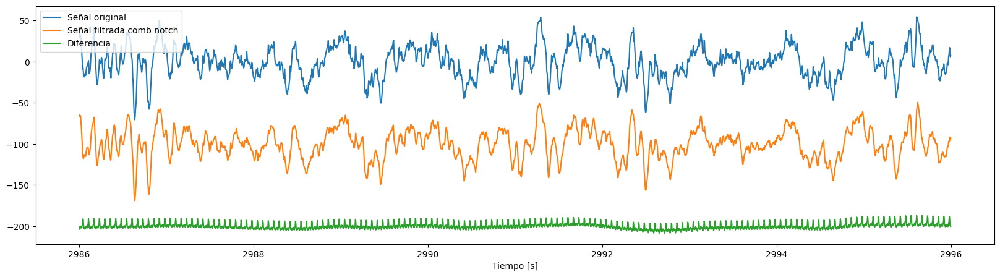

In [ ]:
pos_inic = 110 * fs_mat
pos_fin = 120 * fs_mat

plt.figure(figsize=(20,5))
plt.plot(t_mat[pos_inic:pos_fin], x_mat[canal-1][pos_inic:pos_fin], label='Señal original')
plt.plot(t_mat[pos_inic:pos_fin], filtrada[pos_inic:pos_fin]-100, label='Señal filtrada comb notch')
plt.plot(t_mat[pos_inic:pos_fin], diferencia[pos_inic:pos_fin]-200, label='Diferencia')
plt.xlabel('Tiempo [s]')
plt.legend(loc='upper left')
plt.show()

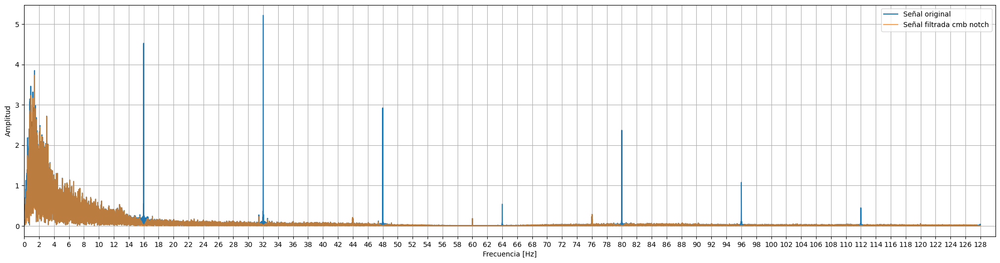

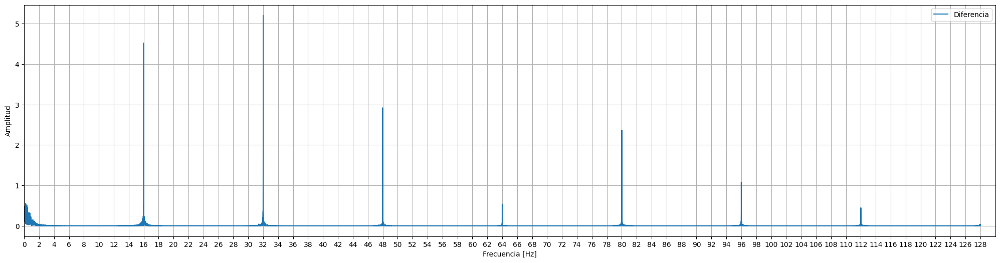

In [ ]:
# FFT de la señal original y la filtrada superpuestas
filtrada_fft = fft(filtrada)
canal_fft = fft(x_mat[canal-1])

L = filtrada_fft.shape[0]

f = np.linspace(0,1,L) * fs_mat
y = 2.0/L * np.abs(canal_fft[0:int(L/2)])

f_filt = np.linspace(0,1,L) * fs_mat
y_filt = 2.0/L * np.abs(filtrada_fft[0:int(L/2)])

plt.figure(figsize = (25,6))
plt.plot(f[:int(L/2)],y, label = 'Señal original')
plt.plot(f_filt[:int(L/2)],y_filt, alpha=0.7, label = 'Señal filtrada cmb notch')
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Amplitud')
plt.legend(loc='upper right')
plt.xlim(0, 130)
plt.xticks(np.arange(0,130,2))
plt.grid()
plt.show()


# FFT de la diferencia
diferencia_fft = fft(diferencia)

L = diferencia_fft.shape[0]

f_filt = np.linspace(0,1,L) * fs_mat
y_filt = 2.0/L * np.abs(diferencia_fft[0:int(L/2)])

plt.figure(figsize = (25,6))
plt.plot(f_filt[:int(L/2)],y_filt, label = 'Diferencia')
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Amplitud')
plt.legend(loc='upper right')
plt.xlim(0, 130)
plt.xticks(np.arange(0,130,2))
plt.grid()
plt.show()

Ahora filtemos las señales del objeto raw del registro del BrainVision (archivos .vhdr) usando las funciones de mne.
Sabíamos que tenía un filtro entre 0.03 y 90 Hz.

In [ ]:
raw_vhdr_0.info

<Info | 8 non-empty values
 bads: []
 ch_names: C3, C4, F3, F4, P3, P4, EOG_bipolar, EMG_bipolar
 chs: 6 EEG, 1 EOG, 1 EMG
 custom_ref_applied: False
 dig: 0 items
 highpass: 0.0 Hz
 lowpass: 90.0 Hz
 meas_date: 2017-10-03 23:45:05 UTC
 nchan: 8
 projs: []
 sfreq: 200.0 Hz
>

Veamos el espectro tanto en unidades lineales ($μV²/Hz$) como en decibeles ($PSD_{dB}=10xlog_{10}(PSD_{lineal})$)

Los decibeles "aprietan" la escala, ofreciendo una mejor visualización de las diferencias en distintos órdenes de magnitud.


Effective window size : 10.240 (s)
Plotting power spectral density (dB=False).


/tmp/ipython-input-4113882466.py:2: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw_vhdr_0.compute_psd().plot(dB=False)


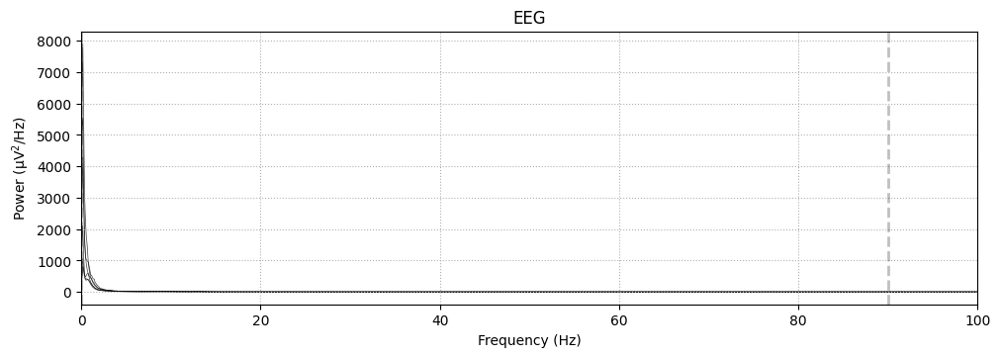

Effective window size : 10.240 (s)
Plotting power spectral density (dB=True).


/tmp/ipython-input-4113882466.py:6: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw_vhdr_0.compute_psd().plot(dB=True)


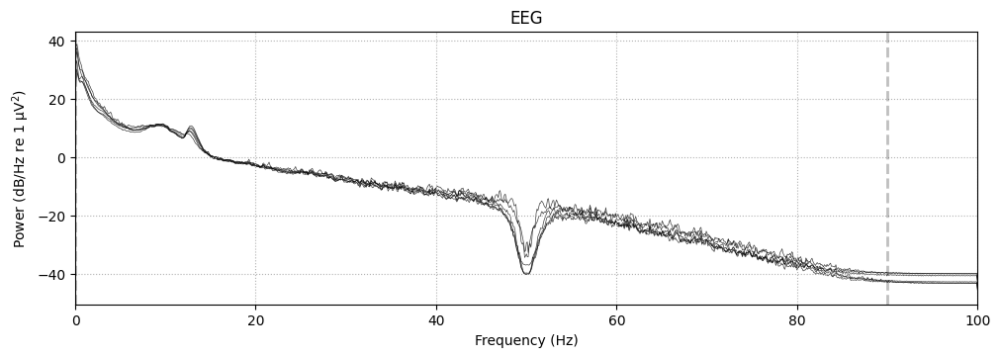

In [ ]:
# Grafico la PSD con la funcion de mne
raw_vhdr_0.compute_psd().plot(dB=False)
plt.show()

# Grafico la PSD con la funcion de mne
raw_vhdr_0.compute_psd().plot(dB=True)
plt.show()

Vemos que también tiene un notch en 50Hz. Filtremos entre 0.5 y 35 Hz y hagamos el espectro nuevamente.

Effective window size : 10.240 (s)
Plotting power spectral density (dB=True).


/tmp/ipython-input-4092377301.py:4: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw_filtered.compute_psd().plot(dB=True)


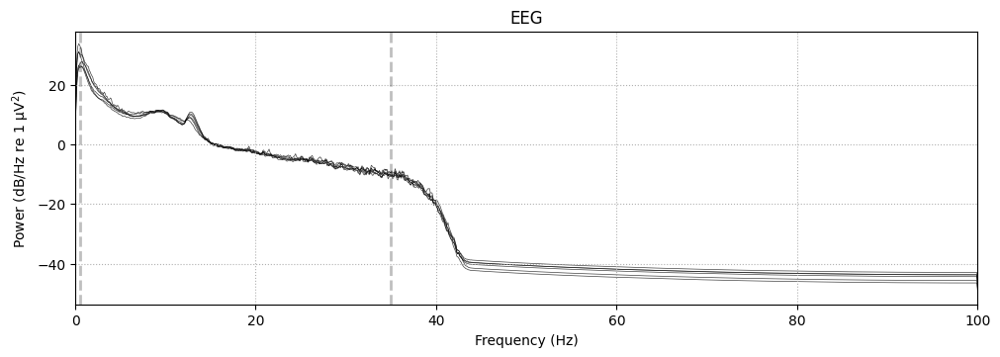

In [ ]:
raw_filtered = raw_vhdr_0.copy().filter(l_freq=0.5, h_freq=35, picks=['eeg'], verbose=False)

# Grafico la PSD con la funcion de mne
raw_filtered.compute_psd().plot(dB=True)
plt.show()

Grafiquemos por ejemplo el canal C3 filtrado y sin filtrar junto con la diferencia.

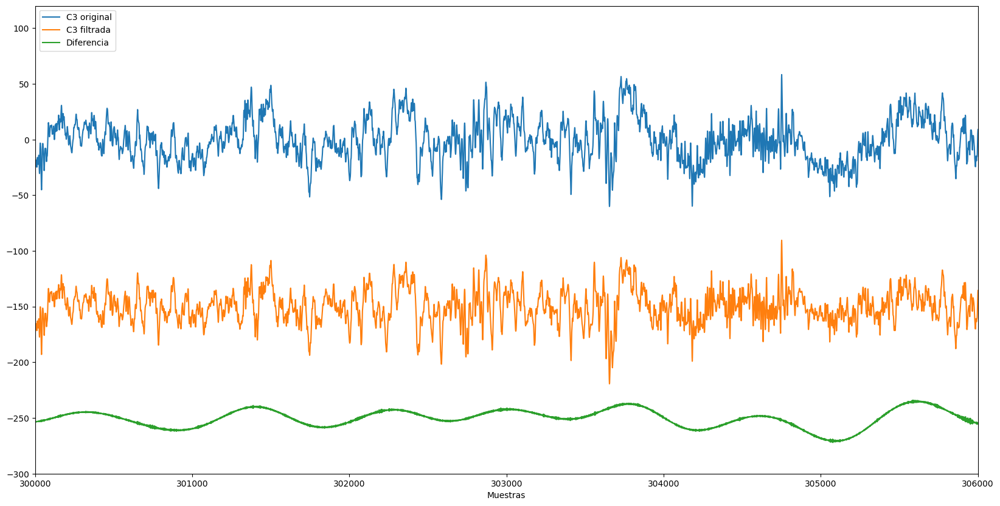

In [ ]:
raw_vhdr_0_C3 = raw_vhdr_0.get_data()[0]*1e6
raw_filtered_C3 = raw_filtered.get_data()[0]*1e6
diferencia = raw_vhdr_0_C3-raw_filtered_C3

# Graficamos las señales
plt.figure(figsize=(20,10))
plt.plot(raw_vhdr_0_C3, label='C3 original')
plt.plot(raw_filtered_C3 - 150, label='C3 filtrada')
plt.plot(diferencia-250, label='Diferencia')
plt.xlabel('Muestras')
plt.legend(loc='upper left')
plt.xlim(50*30*raw_vhdr_0.info['sfreq'], 51*30*raw_vhdr_0.info['sfreq'])
plt.ylim(-300, 120)
plt.show()

# TAREA - EJERCICIOS

## EJERCICIO 1

**Sobre la señal eeg1.mat.**

a. ¿Cuántos canales hay en esta señal?

b. ¿Cuántos segundos de señal se registraron?

c. ¿Cuál es el ritmo dominante de esta señal?

d. Calcular la potencia absoluta y relativa de este ritmo dominante

## 2. EJERCICIO 2

**Extraer el canal "C3-P3" de la señal chb01_04.edf.**

a. ¿Hay ruido de deriva? Si es así, eliminarlo apropiadamente.

b. ¿Hay ruido de alta frecuencia? Si es así, eliminarlo apropiadamente.

c. Comentar ¿Qué otros ruidos/artefactos se observan presente en este canal? ¿Cómo se podrían eliminar?